# Helmholtz's equation (Physics informed)

## Mapping sparse data $u(x,y)$ to the $g(x,y)$

$$ \nabla^2 u(x,y) + k^2u = g(x,y) ~~~ x,y \in (0,1)^2$$ 

$$ u_{\text{bc}} = 0$$

Two gaussian source:
$$ \text{Data}: A \sim U(1,10), ~~x_0, y_0 \sim U(0.2, 0.8), \text{and  } sigma \sim U(0.05, 0.2)$$ 

Number of samples: 3000

In [1]:
from flax import linen as nn
from typing import Sequence, Tuple
import jax
import jax.numpy as jnp
from torch.utils import data
from functools import partial
import time
import optax
import scipy.io
import os
import matplotlib.pyplot as plt
import shutil
import pandas as pd
from jax import jvp
import pickle
from sklearn import metrics
from termcolor import colored
import random
import numpy as np
from scipy.interpolate import griddata
import matplotlib.tri as tri
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.ticker import MaxNLocator, ScalarFormatter

In [2]:
## All inputs

path_data = 'helmholtz_gaussian_sources_dataset.npz'

seed = 32
n_train = int(800*0.8)
batch_size = 75
n_sensors = 32*32 # (x*y)
branch_layers = [32, 32, 32]
h_layers = [32, 32, 32]
branch_input_features = 1
trunk_layers = [32, 32, 32]
trunk_input_features = 2
out_features = 3
hidden_dim = 100
p_test = 100
p_res_train = 2000
result_dir = './'
epochs = 80000
vis_iter = 1000
lr = 1e-3
transition_steps = 2000
decay_rate = 0.9


In [3]:

data_source = jnp.load(path_data, allow_pickle=True)

sources = data_source['sources']
solutions = data_source['solutions']
params_array = data_source['params_array']
params_arr = jnp.array(params_array)

params_array = jnp.delete(params_arr, jnp.array([3]), axis=1)


sensor_32x32 = data_source['sensor_32x32']
sensor_32x32_xcoords = data_source['sensor_32x32_xcoords']
sensor_32x32_ycoords = data_source['sensor_32x32_ycoords']
# sensor_5x5 = data_dline['sensor_5x5']
# sensor_5x5_xcoords = data_dline['sensor_5x5_xcoords']
# sensor_5x5_ycoords = data_dline['sensor_5x5_ycoords']


print("sources: ", sources.shape)
print("solutions: ", solutions.shape)
print("sensor_32x32: ", sensor_32x32.shape)
print("sensor_32x32_xcoords: ", sensor_32x32_xcoords.shape)
print("sensor_32x32_ycoords: ", sensor_32x32_ycoords.shape)

print("params_array: ", params_array.shape)

X_sensor = jnp.array(sensor_32x32).reshape(800, -1)   # (3000, 256)

x_coords = jnp.array(sensor_32x32_xcoords).reshape(-1)   # (256,)
y_coords = jnp.array(sensor_32x32_ycoords).reshape(-1)   # (256,)

sensor_xy = jnp.stack([x_coords, y_coords], axis=1)     # (256, 2)

Y_solutions = jnp.array(solutions).reshape(800, -1)      # (3000, 4096)

n = 64
x_lin = jnp.linspace(0, 1, n)
y_lin = jnp.linspace(0, 1, n)

Xg, Yg = jnp.meshgrid(x_lin, y_lin, indexing="xy")

solutions_xy = jnp.stack([Xg.reshape(-1), Yg.reshape(-1)], axis=1)   # (4096, 2)

print("X_sensor:", X_sensor.shape)
print("sensor_xy:", sensor_xy.shape)
print("Y_solutions:", Y_solutions.shape)
print("solutions_xy:", solutions_xy.shape)

2025-11-27 12:33:21.824684: W external/xla/xla/service/gpu/nvptx_compiler.cc:893] The NVIDIA driver's CUDA version is 12.4 which is older than the PTX compiler version 12.6.68. Because the driver is older than the PTX compiler version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.


sources:  (800, 64, 64)
solutions:  (800, 64, 64)
sensor_32x32:  (800, 32, 32)
sensor_32x32_xcoords:  (32, 32)
sensor_32x32_ycoords:  (32, 32)
params_array:  (800, 3)
X_sensor: (800, 1024)
sensor_xy: (1024, 2)
Y_solutions: (800, 4096)
solutions_xy: (4096, 2)



SAMPLE #0 - PARAMETERS

Source 1:
   Amplitude (A1):     2.5529
   Location (x1, y1):  (0.4821, 0.4546)
   Width (σ1):         0.2000

 Statistics:
   Source min/max:     0.0022 / 2.5508
   Solution min/max:   0.0000 / 0.0983



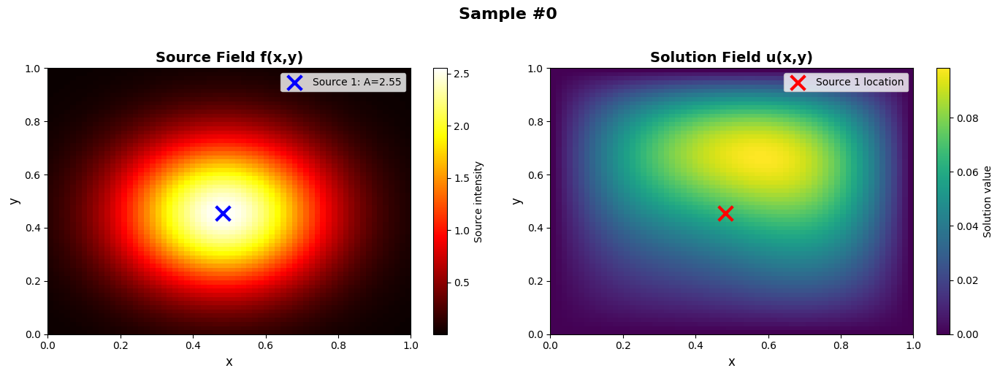


SAMPLE #1 - PARAMETERS

Source 1:
   Amplitude (A1):     3.8541
   Location (x1, y1):  (0.6398, 0.5225)
   Width (σ1):         0.2000

 Statistics:
   Source min/max:     0.0008 / 3.8529
   Solution min/max:   -0.0497 / 0.2090



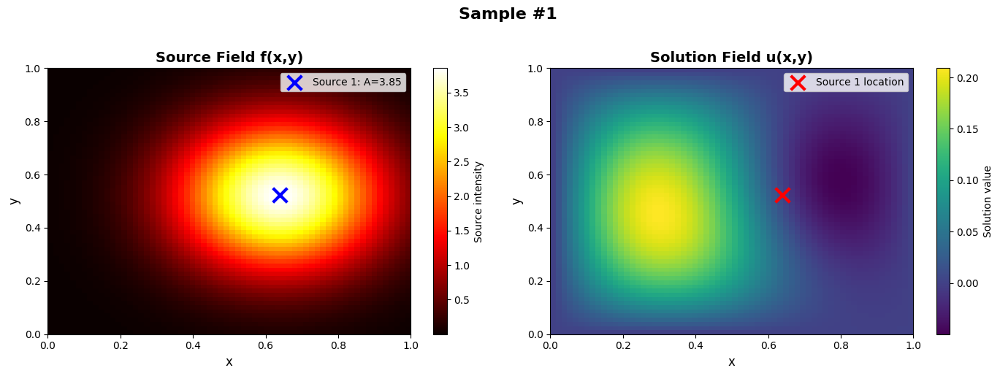


SAMPLE #2 - PARAMETERS

Source 1:
   Amplitude (A1):     2.5419
   Location (x1, y1):  (0.3726, 0.4240)
   Width (σ1):         0.2000

 Statistics:
   Source min/max:     0.0003 / 2.5395
   Solution min/max:   -0.0428 / 0.1429



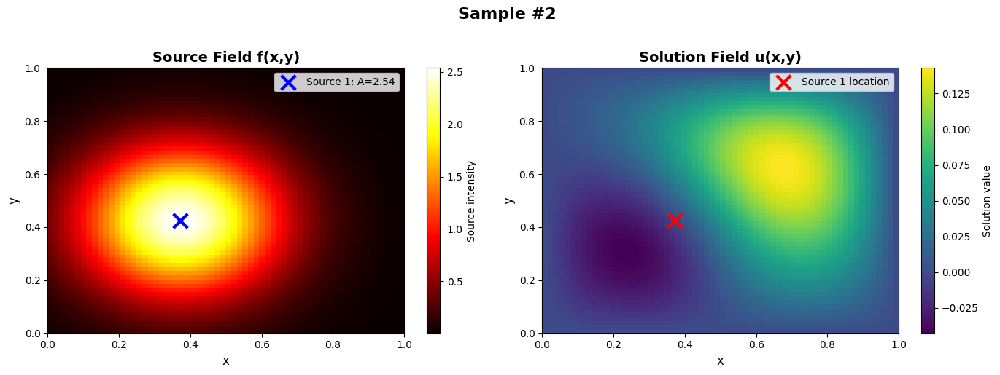

In [4]:
import matplotlib.pyplot as plt

def visualize_sample(idx, sources, solutions, params_array):
    """
    Visualize a single sample with source, solution, and parameters
    
    Parameters for 2 Gaussians:
    [A1, x1, y1, sigma1, A2, x2, y2, sigma2]
    """
    # Extract data
    source = sources[idx]
    solution = solutions[idx]
    params = params_array[idx]
    
    # # Parse parameters
    # x1, y1, sigma1 = params[0:3]
    # A1= 10
    # A1, x1, y1, sigma1 = params[0:4]
    A1, x1, y1 = params[0:3]
    sigma1 = 0.2
    # A2, x2, y2, sigma2 = params[4:8]
    # sigma1, sigma2 = 0.08, 0.08
    # A1, x1, y1 = params[0:3]
    # A2, x2, y2 = params[3:7]
    
    # Create figure
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    
    # Plot 1: Source field f(x,y)
    im1 = axes[0].imshow(source, extent=[0, 1, 0, 1], origin='lower', 
                         cmap='hot', aspect='auto')
    axes[0].scatter([x1], [y1], c='blue', s=200, marker='x', linewidths=3, 
                    label=f'Source 1: A={A1:.2f}')
    # axes[0].scatter([x2], [y2], c='cyan', s=200, marker='x', linewidths=3, 
    #                 label=f'Source 2: A={A2:.2f}')
    axes[0].set_xlabel('x', fontsize=12)
    axes[0].set_ylabel('y', fontsize=12)
    axes[0].set_title(f'Source Field f(x,y)', fontsize=14, fontweight='bold')
    axes[0].legend(loc='upper right', fontsize=10)
    plt.colorbar(im1, ax=axes[0], label='Source intensity')
    
    # Plot 2: Solution field u(x,y)
    im2 = axes[1].imshow(solution, extent=[0, 1, 0, 1], origin='lower', 
                         cmap='viridis', aspect='auto')
    axes[1].scatter([x1], [y1], c='red', s=200, marker='x', linewidths=3, 
                    label='Source 1 location')
    # axes[1].scatter([x2], [y2], c='orange', s=200, marker='x', linewidths=3, 
    #                 label='Source 2 location')
    axes[1].set_xlabel('x', fontsize=12)
    axes[1].set_ylabel('y', fontsize=12)
    axes[1].set_title(f'Solution Field u(x,y)', fontsize=14, fontweight='bold')
    axes[1].legend(loc='upper right', fontsize=10)
    plt.colorbar(im2, ax=axes[1], label='Solution value')
    
    plt.suptitle(f'Sample #{idx}', fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    
    # Print parameters
    print(f"\n{'='*60}")
    print(f"SAMPLE #{idx} - PARAMETERS")
    print(f"{'='*60}")
    print(f"\nSource 1:")
    print(f"   Amplitude (A1):     {A1:.4f}")
    print(f"   Location (x1, y1):  ({x1:.4f}, {y1:.4f})")
    print(f"   Width (σ1):         {sigma1:.4f}")
    
    # print(f"\n Source 2:")
    # print(f"   Amplitude (A2):     {A2:.4f}")
    # print(f"   Location (x2, y2):  ({x2:.4f}, {y2:.4f})")
    # print(f"   Width (σ2):         {sigma2:.4f}")
    
    print(f"\n Statistics:")
    print(f"   Source min/max:     {source.min():.4f} / {source.max():.4f}")
    print(f"   Solution min/max:   {solution.min():.4f} / {solution.max():.4f}")
    # print(f"   Distance between sources: {np.sqrt((x2-x1)**2 + (y2-y1)**2):.4f}")
    print(f"{'='*60}\n")
    
    return fig


# Visualize first 3 samples
for i in range(3):
    i*10
    fig = visualize_sample(i, sources, solutions, params_array)
    plt.savefig(f'sample_{i}.png', dpi=150, bbox_inches='tight')
    plt.show()

In [5]:
# Shuffle the data
indices = np.arange(X_sensor.shape[0])
np.random.shuffle(indices)

shuffled_sensor_data = X_sensor[indices]
shuffled_solution_data = Y_solutions[indices]
shuffled_param_data = params_array[indices]

# Split
X_train = shuffled_sensor_data[:n_train]
X_test = shuffled_sensor_data[n_train:]

y_train = shuffled_sensor_data[:n_train]
y_test = shuffled_solution_data[n_train:]

param_train = shuffled_param_data[:n_train]
param_test = shuffled_param_data[n_train:]


print("X_train: ", str(X_train.shape))
print("X_test: ", str(X_test.shape))

print("y_train: ", str(y_train.shape))
print("y_test: ", str(y_test.shape))

print("param_train: ", str(param_train.shape))
print("param_test: ", str(param_test.shape))

X_train:  (640, 1024)
X_test:  (160, 1024)
y_train:  (640, 1024)
y_test:  (160, 4096)
param_train:  (640, 3)
param_test:  (160, 3)


In [6]:
# Data Generator
class DataGenerator(data.Dataset):
    def __init__(self, u_data, y, s, param, batch_size, gen_key):
        self.u_data = u_data
        self.y = y
        self.s = s
        self.param = param
        self.N = u_data.shape[0]
        self.batch_size = batch_size
        self.key = gen_key

    def __getitem__(self, index):
        """Generate one batch of data"""
        self.key, subkey = jax.random.split(self.key)
        inputs, outputs = self.__data_generation(subkey)
        return inputs, outputs

    @partial(jax.jit, static_argnums=(0,))
    def __data_generation(self, key_i):
        """Generates data containing batch_size samples"""
        idx = jax.random.choice(key_i, self.N, (self.batch_size,), replace=False)
        s = self.s[idx, :]
        y = self.y[:, :]
        u_data = self.u_data[idx]
        param = self.param[idx]
        # Construct batch
        inputs = (u_data, y, param)
        outputs = s
        return inputs, outputs

In [7]:
"""# Data generation for each sample"""
def generate_one_res_training_data(X_train, key, p=2500):
    # p_grid = int(jnp.sqrt(p))  # Base number along each axis
    p_grid = 64
    # Generate sorted 1D points
    # x_res_i = jnp.sort(jax.random.uniform(key, shape=(p_grid,), minval=0.0, maxval=1.0))
    # y_res_i = jnp.sort(jax.random.uniform(key, shape=(p_grid,), minval=0.0, maxval=1.0))
    x_res_i = jnp.linspace(0, 1, p_grid)
    y_res_i = jnp.linspace(0, 1, p_grid)
    
    # Create 3D meshgrid
    x_res, y_res = jnp.meshgrid(x_res_i, y_res_i, indexing='xy')

    # Flatten grids
    x_flat = x_res.flatten()
    y_flat = y_res.flatten()

    # Stack into coordinates shape (N, 2)
    cord = jnp.stack([x_flat, y_flat], axis=-1)

    sol = jnp.zeros((cord.shape[0],))

    return cord, sol

# Generate bcs training data corresponding to one input sample
def generate_one_bcs_training_data(X_train, key, p=100):

    # for x = 0 (left boundary)
    yy_0 = jnp.linspace(0, 1, p).reshape(-1,1)
    xx_0 = jnp.zeros((p, 1))

    cord1 = jnp.hstack([xx_0, yy_0])

    # for x = 1 (right boundary)
    yy_1 = jnp.linspace(0, 1, p).reshape(-1,1)
    xx_1 = jnp.ones((p, 1))

    cord2 = jnp.hstack([xx_1, yy_1])

    # for y = 0 (bottom boundary)
    xx_y0 = jnp.linspace(0, 1, p).reshape(-1,1)
    yy_y0 = jnp.zeros((p, 1))

    cord3 = jnp.hstack([xx_y0, yy_y0])

    # for y = 1 (top boundary)
    xx_y1 = jnp.linspace(0, 1, p).reshape(-1,1)
    yy_y1 = jnp.ones((p, 1))

    cord4 = jnp.hstack([xx_y1, yy_y1])

    cord = jnp.hstack([cord1, cord2, cord3, cord4])  # shape = (p, 8)
    s = jnp.zeros((p,))  # Shape: (p,)

    return cord, s

In [8]:
"""# Data generation for each sample"""

key = jax.random.PRNGKey(seed)
keys = jax.random.split(key, 6)

print("----Coll----")
# Residual data
cord_res_train, s_res_train = jax.vmap(generate_one_res_training_data, in_axes=(0, None, None))(X_train, key, p_res_train)

print("s_res_train: ", str(s_res_train.shape))  # (25, 4080)
print("cord_res_train: ", str(cord_res_train.shape)) # Expected: (25, 4080, 2)

print("----boundary----")
# Residual data
cord_bc_train, s_bc_train = jax.vmap(generate_one_bcs_training_data, in_axes=(0, None, None))(X_train, key, p_res_train)

print("s_bc_train: ", str(s_bc_train.shape))  # (25, 4080)
print("cord_bc_train: ", str(cord_bc_train.shape)) # Expected: (25, 4080, 2)

data_dataset = DataGenerator(X_train, sensor_xy, y_train, param_train, batch_size, keys[0])

# Create data generators

res_dataset = DataGenerator(X_train, cord_res_train, s_res_train, param_train, batch_size, keys[2])
bc_dataset = DataGenerator(X_train, cord_bc_train, s_bc_train, param_train, batch_size, keys[1])



----Coll----
s_res_train:  (640, 4096)
cord_res_train:  (640, 4096, 2)
----boundary----
s_bc_train:  (640, 2000)
cord_bc_train:  (640, 2000, 8)


In [9]:
class DeepONet(nn.Module):
    branch_layers: Sequence[int]
    trunk_layers: Sequence[int]
    output_dim: int = 1

    @nn.compact
    def __call__(self, branch_x, trunk_x):

        init = nn.initializers.glorot_normal()

        if branch_x.ndim == 1:
            branch_x = jnp.expand_dims(branch_x, axis=-1)

        for i, fs in enumerate(self.branch_layers[:-1]):
            branch_x = nn.Dense(fs, kernel_init=init, name=f"branch_{i}")(branch_x)
            branch_x = nn.activation.tanh(branch_x)
        branch_x = nn.Dense(self.branch_layers[-1], name=f"branch_{i+1}", kernel_init=init)(branch_x)

        if trunk_x.ndim == 1:
            trunk_x = jnp.expand_dims(trunk_x, axis=0)

        for i, fs in enumerate(self.trunk_layers):
            trunk_x = nn.Dense(fs, kernel_init=init, name=f"trunk_{i}")(trunk_x)
            trunk_x = nn.activation.tanh(trunk_x)

        # [x_num, p]

        # Compute the final output
        # Input shapes:
        # branch: [batch_size, p]
        # trunk: [x_num, p]
        # output: [batch_size, x_num]
        result = jnp.einsum('ij,kj->ik', branch_x, trunk_x)

        # Add bias
        bias = self.param('output_bias', nn.initializers.zeros, (self.output_dim,))
        result += bias

        return result

In [10]:
class INV_MLP(nn.Module):
    h_layers: Sequence[int]
    output_dim: int = 1

    @nn.compact
    def __call__(self, x,):

        init = nn.initializers.glorot_normal()

        if x.ndim == 1:
            x = jnp.expand_dims(x, axis=-1)

        for i, fs in enumerate(self.h_layers[:-1]):
            x = nn.Dense(fs, kernel_init=init, name=f"h_{i}")(x)
            x = nn.activation.gelu(x)
        x = nn.Dense(self.h_layers[-1], name=f"h_{i+1}", kernel_init=init)(x)

        # Add bias
        bias = self.param('output_bias', nn.initializers.zeros, (self.output_dim,))
        x += bias


        # A1: [2, 6]
        A1 = 2 + 4 * nn.sigmoid(x[:, 0:1])
    
        # x0: [0.35, 0.65]
        x01 = 0.35 + 0.3 * nn.sigmoid(x[:, 1:2])
        
        # y0: [0.35, 0.65]
        y01 = 0.35 + 0.3 * nn.sigmoid(x[:, 2:3])
        
        x_out = jnp.concatenate([A1, x01, y01], axis=-1)

        return x_out

In [11]:
"""# Helper functions"""

@partial(jax.jit)
def mse(y_true, y_pred):
    return jnp.mean(jnp.square(y_true - y_pred))

@partial(jax.jit)
def mse_single(y_pred):
    return jnp.mean(jnp.square(y_pred))

@partial(jax.jit, static_argnums=(0,))
def apply_net(model_fn, params, branch_input, *trunk_in):
    if len(trunk_in) == 1:
        trunk_input = trunk_in[0]
    else:
        trunk_input = jnp.stack(trunk_in, axis=-1)
    out = model_fn(params, branch_input, trunk_input)

    if out.shape[1]==1:
        out = jnp.squeeze(out, axis=1)
    return out

@partial(jax.jit, static_argnums=(0,))
def apply_net_k(model_inv_fn, params, input_u):

    out = model_inv_fn(params, input_u)

    if out.shape[1]==1:
        out = jnp.squeeze(out, axis=1)
    return out


@partial(jax.jit, static_argnums=(0, 1, 2, 3))
def step(optimizer, loss_fn, model_fn, model_inv_fn, opt_state, params_step, res_batch, data_batch, bcs_batch):
    loss, gradient = jax.value_and_grad(loss_fn, argnums=2)(model_fn, model_inv_fn, params_step, res_batch, data_batch, bcs_batch)
# def step(optimizer, loss_fn, model_fn, model_inv_fn, opt_state, params_step, res_batch, data_batch):
#     loss, gradient = jax.value_and_grad(loss_fn, argnums=2)(model_fn, model_inv_fn, params_step, res_batch, data_batch)
    updates, opt_state = optimizer.update(gradient, opt_state)
    params_step = optax.apply_updates(params_step, updates)

    return loss, params_step, opt_state

In [12]:
"""# Loss functions"""
def gaussian_source(x, y, A, x0, y0, sigma):
    """Single Gaussian source"""
    return A * jnp.exp(-((x - x0)**2 + (y - y0)**2) / (2 * sigma**2))

# def multi_gaussian_source(X, Y, params):
#     """
#     params = [A1, x1, y1, sigma1, A2, x2, y2, sigma2, ...]
#     """
#     n_sources = len(params) // 4
#     f = jnp.zeros_like(X)
    
#     for i in range(n_sources):
#         A = params[4*i]
#         x0 = params[4*i + 1]
#         y0 = params[4*i + 2]
#         sigma = params[4*i + 3]
        
#         f += gaussian_source(X, Y, A, x0, y0, sigma)
    
#     return f

def multi_gaussian_source(X, Y, params):
    """
    params = [A1, x1, y1, sigma1, A2, x2, y2, sigma2, ...]
    """
    n_sources = len(params) // 3
    f = jnp.zeros_like(X)
    
    for i in range(n_sources):
        A = params[3*i]
        x0 =  params[3*i + 1]
        y0 = params[3*i + 2]
        sigma = 0.2
        
        f += gaussian_source(X, Y, A, x0, y0, sigma)
    
    return f


def reconstruct_gaussian_source(params, n=64):
    """Reconstruct source field from parameters"""
    x = jnp.linspace(0, 1, n)
    y = jnp.linspace(0, 1, n)
    X, Y = jnp.meshgrid(x, y, indexing="xy")
    
    source_rec = multi_gaussian_source(X, Y, params)
    return source_rec


def loss_res(model_fn, model_inv_fn, params, res_batch):
    # Fetch data
    inputs, _ = res_batch
    u_data, cord, perm_true = inputs
    
    params_sol, params_inv = params
    
    # rand_num = random.randint(0, batch_size-1)
    x = cord[0, :, 0]
    y = cord[0, :, 1]

    def f(x, y):
        return apply_net(model_fn, params_sol, u_data, x, y)

    # Compute forward pass
    s = f(x, y)

    # Compute first derivatives using jvp
    _, s_x = jax.jvp(lambda x: f(x, y), (x,), (jnp.ones_like(x),))
    _, s_y = jax.jvp(lambda y: f(x, y), (y,), (jnp.ones_like(y),))


    _, s_xx = jax.jvp(lambda x: jax.jvp(lambda x: f(x, y), (x,), (jnp.ones_like(x),))[1], (x,), (jnp.ones_like(x),))
    _, s_yy = jax.jvp(lambda y: jax.jvp(lambda y: f(x, y), (y,), (jnp.ones_like(y),))[1], (y,), (jnp.ones_like(y),))

    perm_pred_all = apply_net_k(model_inv_fn, params_inv, u_data)
    # perm_pred_all = perm_true

#     print(perm_pred_all.shape)
    # A1, x01, y01, sigma1 = perm_pred_all[:,0], perm_pred_all[:,1], perm_pred_all[:,2], perm_pred_all[:,3]
    # A2, x02, y02, sigma2 = perm_pred_all[:,4], perm_pred_all[:,5], perm_pred_all[:,6], perm_pred_all[:,7]
    source_rec = jax.vmap(reconstruct_gaussian_source, in_axes=0, out_axes=0)(perm_pred_all)
    # source_rec = reconstruct_gaussian_source(perm_pred_all)
    
    source_rec = source_rec.reshape(source_rec.shape[0], -1)
    # print("s_xx: ", s_xx.shape)
    # print("s_yy: ", s_yy.shape)
    # print("source_rec: ", source_rec.shape)
    
    k = 2*jnp.pi
    # Compute residual
    pred = s_xx + s_yy + k**2*s - source_rec
    
    # Compute loss
    loss = mse_single(pred)
    return loss


def loss_data(model_fn, params, data_batch):

    inputs, outputs = data_batch
    u_data, cord, _ = inputs
    
    params_sol, params_inv = params
    
    x = cord[:, 0]
    y = cord[:, 1]

    s_pred = apply_net(model_fn, params_sol, u_data, x, y)

    loss = mse(outputs, s_pred)
    return loss

def loss_bcs(model_fn, params, bcs_batch):
    
    params_sol, params_inv = params
    
    inputs, outputs = bcs_batch
    u_data, cord, _ = inputs

    rand_num = random.randint(0, n_train)
    
    # left right bottom top

    s_bc1_pred = apply_net(model_fn, params_sol, u_data, cord[rand_num,:, 0], cord[rand_num,:, 1]) # x = 0
    s_bc2_pred = apply_net(model_fn, params_sol, u_data, cord[rand_num,:, 2], cord[rand_num,:, 3]) # x = 1
    s_bc3_pred = apply_net(model_fn, params_sol, u_data, cord[rand_num,:, 4], cord[rand_num,:, 5]) # y = 0
    s_bc4_pred = apply_net(model_fn, params_sol, u_data, cord[rand_num,:, 6], cord[rand_num,:, 7]) # y = 1

#     print("s_bc1_pred: ", str(s_bc1_pred.shape))
#     print("s_bc2_pred: ", str(s_bc2_pred.shape))

    loss_s_bc1 = mse(s_bc1_pred, outputs)
    loss_s_bc2 = mse(s_bc2_pred, outputs)
    loss_s_bc3 = mse(s_bc3_pred, outputs)
    loss_s_bc4 = mse(s_bc4_pred, outputs)

    return loss_s_bc1 + loss_s_bc2 + loss_s_bc3 + loss_s_bc4
    
#     loss_s_bc_u_lr = mse(s_bc1_pred, s_bc2_pred)
#     loss_s_bc_u_tb = mse(s_bc3_pred, s_bc4_pred)
    
#     def f(x, y):
#         return apply_net(model_fn, params_sol, u_data, x, y)
    
#     x_l = cord[rand_num, :, 0]
#     y_l = cord[rand_num, :, 1]
#     x_r = cord[rand_num, :, 2]
#     y_r = cord[rand_num, :, 3]
    
#     # Compute first derivatives using jvp
#     _, u_x_l = jax.jvp(lambda x: f(x, y_l), (x_l,), (jnp.ones_like(x_l),))
#     _, u_x_r = jax.jvp(lambda x: f(x, y_r), (x_r,), (jnp.ones_like(x_r),))
    
#     loss_s_bc_du_lr = mse(u_x_l, u_x_r)
    
#     x_b = cord[rand_num, :, 4]
#     y_b = cord[rand_num, :, 5]
#     x_t = cord[rand_num, :, 6]
#     y_t = cord[rand_num, :, 7]
    
#     # Compute first derivatives using jvp
#     _, u_y_b = jax.jvp(lambda y: f(x_b, y), (y_b,), (jnp.ones_like(y_b),))
#     _, u_y_t = jax.jvp(lambda y: f(x_t, y), (y_t,), (jnp.ones_like(y_t),))
    
#     loss_s_bc_du_bt = mse(u_y_b, u_y_t)
    
#     return loss_s_bc_u_lr + loss_s_bc_u_tb + loss_s_bc_du_lr + loss_s_bc_du_bt
    
    
    

def loss_fn(model_fn, model_inv_fn, params,  res_batch, data_batch, bcs_batch):
# def loss_fn(model_fn, model_inv_fn, params,  res_batch, data_batch):
    loss_res_i = loss_res(model_fn, model_inv_fn, params, res_batch)
    loss_data_i = loss_data(model_fn, params, data_batch)
    loss_bc_i = loss_bcs(model_fn, params, bcs_batch)
    
    loss_value = 10.0*loss_data_i + 1.0*loss_res_i + loss_bc_i
    return loss_value

In [13]:
"""# Initialize the model"""

# Initialize model and params
# make sure trunk_layers and branch_layers are lists
trunk_layers = [trunk_layers] if isinstance(trunk_layers, int) else trunk_layers

branch_layers = [branch_layers] if isinstance(branch_layers, int) else branch_layers

h_layers = [h_layers] if isinstance(h_layers, int) else h_layers


# add output features to trunk and branch layers
trunk_layers = trunk_layers + [hidden_dim]
branch_layers = branch_layers + [hidden_dim]
h_layers = h_layers + [out_features]


# Convert list to tuples
trunk_layers = tuple(trunk_layers)
branch_layers = tuple(branch_layers)
h_layers = tuple(h_layers)

num_outputs = 1
model = DeepONet(branch_layers, trunk_layers, num_outputs)

# model function
model_fn = jax.jit(model.apply)

num_outputs = 1
model_inv = INV_MLP(h_layers, num_outputs)

params_inv = model_inv.init(key, jnp.ones(shape=(1, n_sensors * branch_input_features)))

# Print model from parameters
print('--- model_inv_summary ---')
# count total params
total_params = sum(x.size for x in jax.tree_util.tree_leaves(params_inv))
print(f'total params: {total_params}')

# model function
model_inv_fn = jax.jit(model_inv.apply)

2025-11-27 12:33:41.517029: E external/xla/xla/service/hlo_lexer.cc:438] Failed to parse int literal: 894515288310727292233


--- model_inv_summary ---
total params: 35012


In [14]:
"""# model save function"""

def save_model_params(params, result_dir, filename='model_params.pkl'):
    if not os.path.exists(result_dir):
        os.makedirs(result_dir)

    save_path = os.path.join(result_dir, filename)
    with open(save_path, 'wb') as f:
        pickle.dump(params, f)

def load_model_params(result_dir, filename='model_params_best.pkl'):
    load_path = os.path.join(result_dir, filename)
    with open(load_path, 'rb') as f:
        params = pickle.load(f)
    return params

# Usage:
save = True

In [15]:
save = True
params_loaded = load_model_params('/home/droysar1/scr4_sgoswam4/Dibakar/INV_DON/helmholtz_source_ID/solution_op_32/')

print("Loaded best model parameters")

params = (params_loaded, params_inv)


Loaded best model parameters


In [16]:
def loss_test_l2_error_u(model_fn, params, X_test, y_test, full_solution_coordinates, return_data=False):

    x = full_solution_coordinates[:,0]
    y = full_solution_coordinates[:,1]

    def ff_net(x, y):
        s_pred = apply_net(model_fn, params, X_test, x, y)
        return s_pred

    s_pred = ff_net(x, y)

    loss_test = mse(y_test, s_pred)

    def l2_norm_error(a, b):
        """Calculate L2 norm error between two 2D arrays."""
        return jnp.linalg.norm(a - b)/jnp.linalg.norm(a)

    l2_error = jnp.mean(jax.vmap(l2_norm_error)(y_test, s_pred))

    if return_data:
        return loss_test, l2_error, s_pred
    else:
        return loss_test, l2_error
    
loss_test, l2_error, s_pred = loss_test_l2_error_u(model_fn, params_loaded, X_test, y_test, solutions_xy, return_data=True)

print(s_pred.shape)

(160, 4096)


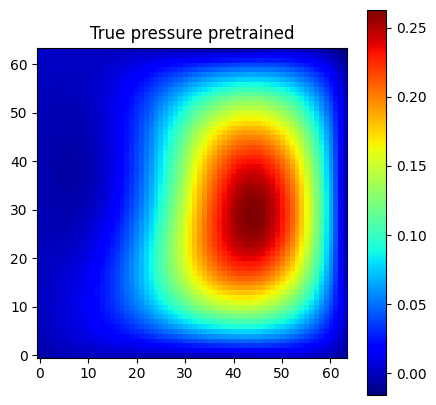

In [17]:

s_pred_i = s_pred[10].reshape(64,64)
fig, axes = plt.subplots(1, 1, figsize=(5, 5))

im1 = axes.imshow(s_pred_i, origin='lower', cmap='jet')
axes.set_title('True pressure pretrained')
plt.colorbar(im1, ax=axes)

In [18]:
"""# Test error function"""

def gaussian_source(x, y, A, x0, y0, sigma):
    """Single Gaussian source"""
    return A * jnp.exp(-((x - x0)**2 + (y - y0)**2) / (2 * sigma**2))

# def multi_gaussian_source(X, Y, params):
#     """
#     params = [A1, x1, y1, sigma1, A2, x2, y2, sigma2, ...]
#     """
#     n_sources = len(params) // 4
#     f = jnp.zeros_like(X)
    
#     for i in range(n_sources):
#         A = params[4*i]
#         x0 = params[4*i + 1]
#         y0 = params[4*i + 2]
#         sigma = params[4*i + 3]
        
#         f += gaussian_source(X, Y, A, x0, y0, sigma)
    
#     return f

def multi_gaussian_source(X, Y, params):
    """
    params = [A1, x1, y1, sigma1, A2, x2, y2, sigma2, ...]
    """
    n_sources = len(params) // 3
    f = jnp.zeros_like(X)
    
    for i in range(n_sources):
        A = params[3*i]
        x0 =  params[3*i + 1]
        y0 = params[3*i + 2]
        sigma = 0.2
        
        f += gaussian_source(X, Y, A, x0, y0, sigma)
    
    return f

def reconstruct_gaussian_source(params, n=64):
    """Reconstruct source field from parameters"""
    x = jnp.linspace(0, 1, n)
    y = jnp.linspace(0, 1, n)
    X, Y = jnp.meshgrid(x, y, indexing="xy")
    
    source_rec = multi_gaussian_source(X, Y, params)
    return source_rec


def loss_test_l2_error(model_fn, model_inv_fn, params, X_test, y_test, full_solution_coordinates, param_test, return_data=False):

    x = full_solution_coordinates[:,0]
    y = full_solution_coordinates[:,1]
    
    params_sol, params_inv = params

    def ff_net(x, y):
        s_pred = apply_net(model_fn, params_sol, X_test, x, y)
        return s_pred

    s_pred = ff_net(x, y)

    loss_test = mse(y_test, s_pred)

    def l2_norm_error(a, b):
        """Calculate L2 norm error between two 2D arrays."""
        return jnp.linalg.norm(a - b)/jnp.linalg.norm(a)

    l2_error = jnp.mean(jax.vmap(l2_norm_error)(y_test, s_pred))

    if return_data:
        # perm_pred_all = apply_net_k(model_inv_fn, params_inv, X_test)
        
        start = time.time()
        perm_pred_all = apply_net_k(model_inv_fn, params_inv, X_test)
        end = time.time()

        print("Runtime:", end - start, "seconds")
        # w1, w2, q1, q2, q3 = perm_pred_all[:,0], perm_pred_all[:,1], perm_pred_all[:,2], perm_pred_all[:,3], perm_pred_all[:,4]
        # w1, w2, q1, q2, q3 = param_test[:,0], param_test[:,1], param_test[:,2], param_test[:,3], param_test[:,4]
        
        source_rec = jax.vmap(reconstruct_gaussian_source, in_axes=0, out_axes=0)(perm_pred_all)
        
        source_true = jax.vmap(reconstruct_gaussian_source, in_axes=0, out_axes=0)(param_test)
        
#         print("perm_pred: ", perm_pred.shape)
#         print("perm_test: ", perm_test.shape)
        # print("w1_t: ", w1_t[0])
        # print("w1: ", w1[0])
        # print("w2_t: ", w2_t[0])
        # print("w2: ", w2[0])
        # print("q1_t: ", q1_t[0])
        # print("q1: ", q1[0])
        # print("q2_t: ", q2_t[0])
        # print("q2: ", q2[0])
        # print("q3_t: ", q3_t[0])
        # print("q3: ", q3[0])
        
        
        l2_error_source = jnp.mean(jax.vmap(l2_norm_error)(source_true, source_rec))
        
        return loss_test, l2_error, s_pred, source_rec, l2_error_source, source_true, perm_pred_all, param_test
    else:
        return loss_test, l2_error

In [19]:
# loss_test_l2_error(model_fn, model_inv_fn, params, X_test, y_test, solutions_xy, param_test, return_data=True)

In [19]:
"""# Define optimiser"""

# Define optimizer with optax (ADAM)
# optimizer

lr_scheduler = optax.exponential_decay(lr, transition_steps, decay_rate)

# lr_scheduler = optax.constant_schedule(1e-3)

optimizer = optax.adam(learning_rate=lr_scheduler)
opt_state = optimizer.init(params)

# Data
res_data = iter(res_dataset)
data_data = iter(data_dataset)
bc_data = iter(bc_dataset)

# create dir for saving results
result_dir = os.path.join(os.getcwd(), os.path.join(result_dir, f"inv_op_{seed}"))
log_file = os.path.join(result_dir, 'log.csv')
# Create directory
if not os.path.exists(result_dir):
    os.makedirs(result_dir)
if os.path.exists(os.path.join(result_dir, 'vis')):
    shutil.rmtree(os.path.join(result_dir, 'vis'))
if os.path.exists(log_file):
    os.remove(log_file)


with open(log_file, 'a') as f:
    f.write('epoch,loss,loss_res_value,loss_data_value,loss_bc_value,l2err_test,loss_test,runtime\n')
    # f.write('epoch,loss,loss_res_value,loss_data_value,l2err_test,loss_test,runtime\n')    

In [21]:
"""# Training loop"""

# Iterations
epochs = epochs  # Assuming 'epochs' is defined elsewhere
log_iter = 1000
best_test_mse = float('inf')  # Initialize with infinity
# Save initial model at 0th iteration
save_model_params(params, result_dir, filename='model_params_best.pkl')
print("Saved initial model at iteration 0")
# Training loop
for it in range(epochs):
    if it == 1:
        # start timer and exclude first iteration (compile time)
        start = time.time()
    # Fetch data
    res_batch = next(res_data)
    data_batch = next(data_data)
    bcs_batch = next(bc_data)
    
    # Do Step
    loss, params, opt_state = step(optimizer, loss_fn, model_fn, model_inv_fn, opt_state,
                                   params, res_batch, data_batch, bcs_batch)
    # loss, params, opt_state = step(optimizer, loss_fn, model_fn, model_inv_fn, opt_state,
    #                                params, res_batch, data_batch)
    if it % log_iter == 0:
        # Compute losses
        loss = loss_fn(model_fn, model_inv_fn, params, res_batch, data_batch, bcs_batch)
        # loss = loss_fn(model_fn, model_inv_fn, params, res_batch, data_batch)
        loss_res_value = loss_res(model_fn, model_inv_fn, params, res_batch)
        loss_data_value = loss_data(model_fn, params, data_batch)
        loss_bc_value = loss_bcs(model_fn, params, bcs_batch)
        
        # Calculate loss and l2 error for test samples
        loss_test, l2_error = loss_test_l2_error(model_fn, model_inv_fn, params, X_test, y_test, solutions_xy, param_test, return_data=False)

        if loss_test < best_test_mse:
            best_test_mse = loss_test
            # Save the model as it's the best so far
            save_model_params(params, result_dir, filename='model_params_best.pkl')
            print(f"New best model saved at iteration {it} with test MSE: {loss_test:.2e}")

        # get runtime
        if it == 0:
            runtime = 0
        else:
            runtime = time.time() - start

        # Print losses
        print(f"Iteration {it+1}/{epochs}")
        print(f"Trian_loss: {loss:.2e}, "
              f"loss_res: {loss_res_value:.2e}, loss_data: {loss_data_value:.2e}, loss_bc: {loss_bc_value:.2e}, l2_err_test: {l2_error:.2e}, test_loss: {loss_test:.2e} , runtime: {runtime:06.2f}")
              # f"loss_res: {loss_res_value:.2e}, loss_data: {loss_data_value:.2e}, l2_err_test: {l2_error:.2e}, test_loss: {loss_test:.2e} , runtime: {runtime:06.2f}")
              

        # Save results
        with open(log_file, 'a') as f:
            f.write(f'{it+1}, {loss},'
                    f'{loss_res_value}, {loss_data_value}, {loss_bc_value}, {l2_error}, {loss_test}, {runtime}\n')
                    # f'{loss_res_value}, {loss_data_value}, {l2_error}, {loss_test}, {runtime}\n')
                    

# Save results
runtime = time.time() - start
# Save initial model at 0th iteration
save_model_params(params, result_dir, filename='model_params_last.pkl')
print("Saved model at end of training")
with open(log_file, 'a') as f:
    f.write(f'{it + 1}, {loss},'
            f'{loss_res_value}, {loss_data_value}, {loss_bc_value}, {l2_error}, {loss_test}, {runtime}\n')
            # f'{loss_res_value}, {loss_data_value}, {l2_error}, {loss_test}, {runtime}\n')            

Saved initial model at iteration 0
New best model saved at iteration 0 with test MSE: 1.09e-02
Iteration 1/80000
Trian_loss: 1.66e+01, loss_res: 1.64e+01, loss_data: 1.01e-02, loss_bc: 8.70e-02, l2_err_test: 1.15e+00, test_loss: 1.09e-02 , runtime: 000.00
New best model saved at iteration 1000 with test MSE: 1.96e-03
Iteration 1001/80000
Trian_loss: 3.81e-02, loss_res: 1.49e-02, loss_data: 2.22e-03, loss_bc: 1.05e-03, l2_err_test: 4.87e-01, test_loss: 1.96e-03 , runtime: 002.42
Iteration 2001/80000
Trian_loss: 8.25e-02, loss_res: 5.37e-02, loss_data: 2.81e-03, loss_bc: 6.73e-04, l2_err_test: 5.78e-01, test_loss: 2.72e-03 , runtime: 004.75
Iteration 3001/80000
Trian_loss: 8.78e-02, loss_res: 3.77e-02, loss_data: 4.88e-03, loss_bc: 1.32e-03, l2_err_test: 7.56e-01, test_loss: 4.74e-03 , runtime: 007.07
Iteration 4001/80000
Trian_loss: 6.17e-02, loss_res: 2.07e-02, loss_data: 4.01e-03, loss_bc: 9.97e-04, l2_err_test: 6.96e-01, test_loss: 4.09e-03 , runtime: 009.40
Iteration 5001/80000
Tria

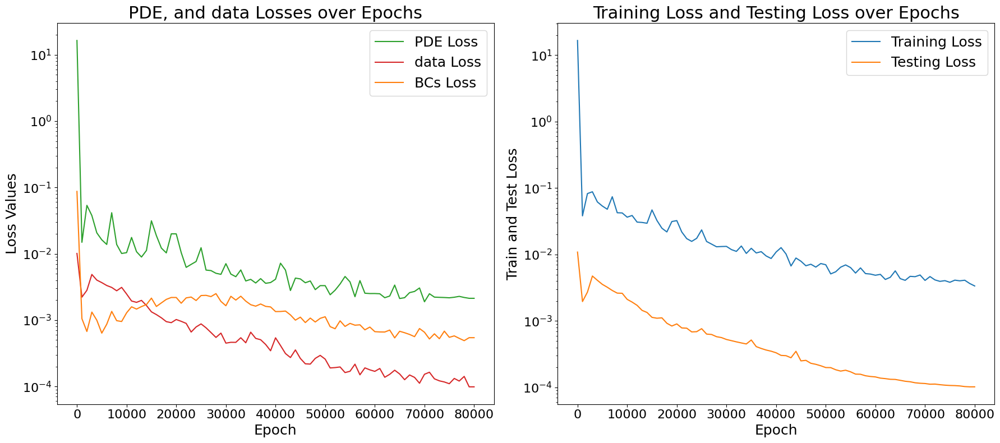

Plots saved to /scratch4/sgoswam4/Dibakar/INV_DON/helmholtz_source_ID/./inv_op_32/train_and_test_loss_plots.png


In [22]:
"""# Loss plots"""

# Read the CSV file
csv_file = os.path.join(result_dir, "log.csv")  # Assuming the file is named "log.csv"
df = pd.read_csv(csv_file)

# Create the figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8), dpi=100)

# Set color palette
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

# Left plot: epoch vs loss_data, and loss_res_value
ax1.plot(df['epoch'], df['loss_res_value'], label='PDE Loss', color=colors[2], linestyle='-')
ax1.plot(df['epoch'], df['loss_data_value'], label='data Loss', color=colors[3], linestyle='-')
ax1.plot(df['epoch'], df['loss_bc_value'], label='BCs Loss', color=colors[1], linestyle='-')


ax1.set_yscale("log")
ax1.set_xlabel('Epoch', fontsize=18)
ax1.set_ylabel('Loss Values', fontsize=18)
ax1.set_title('PDE, and data Losses over Epochs', fontsize=22)
ax1.legend(loc='best', fontsize=18)
ax1.tick_params(axis='both', which='major', labelsize=16)  # Set axis ticks font size

# Right plot: epoch vs loss and l2err_val
ax2.plot(df['epoch'], df['loss'], label='Training Loss', color=colors[0], linestyle='-')
ax2.plot(df['epoch'], df['loss_test'], label='Testing Loss', color=colors[1], linestyle='-')
ax2.set_yscale("log")
ax2.set_xlabel('Epoch', fontsize=18)
ax2.set_ylabel('Train and Test Loss', fontsize=18)
ax2.set_title('Training Loss and Testing Loss over Epochs', fontsize=22)
ax2.legend(loc='best', fontsize=18)
ax2.tick_params(axis='both', which='major', labelsize=16)  # Set axis ticks font size

# Adjust layout and save the figure
plt.tight_layout()
output_file = os.path.join(result_dir, "train_and_test_loss_plots.png")
plt.savefig(output_file, dpi=100)
plt.show()
plt.close()

print(f"Plots saved to {output_file}")

In [20]:
params = load_model_params(result_dir, filename='model_params_last.pkl')

loss_test, l2_error_sol, s_pred, source_rec, l2_error_source, source_true, perm_pred_all, perm_test = loss_test_l2_error(model_fn, model_inv_fn, params, X_test, y_test, solutions_xy, param_test, return_data=True)

Runtime: 0.16608309745788574 seconds


In [21]:
l2_error_sol, l2_error_source, perm_pred_all.shape, perm_test.shape

(Array(0.09847019, dtype=float32),
 Array(0.21889845, dtype=float32),
 (160, 3),
 (160, 3))

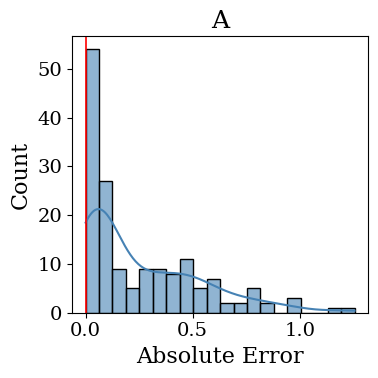

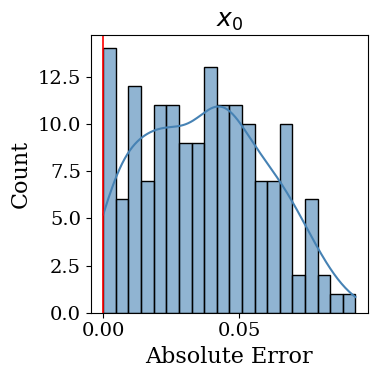

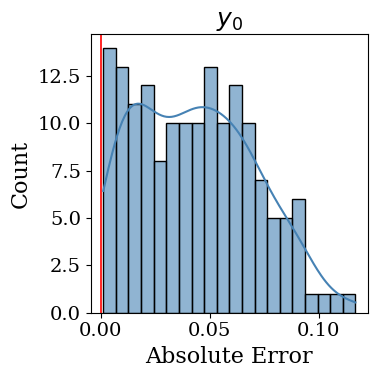

In [22]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# =====================================================================
# Global fonts (your style)
# =====================================================================
tex_fonts = {
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
    "axes.titlesize": 18,
    "axes.labelsize": 16,
    "font.size": 14,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 14,
}
plt.rcParams.update(tex_fonts)

# =====================================================================
# params_pred_all: shape (160, 3)
# params_test    : shape (160, 3)
# =====================================================================

def plot_abs_error_distributions(params_pred_all, params_test, save_prefix=None):
    """
    Plot absolute error histograms (with KDE) for 3 parameters.
    """
    # absolute error for each parameter
    abs_err = np.abs(params_pred_all - params_test)   # shape (160, 3)
    
    param_names = ["A", "$x_0$", "$y_0$"]

    for j in range(3):
        errors = abs_err[:, j]

        plt.figure(figsize=(4.0, 4.0))
        sns.histplot(
            errors,
            bins=20,
            kde=True,
            color="steelblue",
            edgecolor="black",
            alpha=0.6
        )

        # vertical reference line at 0
        plt.axvline(0, color="red", linewidth=1.2)

        plt.xlabel("Absolute Error")
        plt.ylabel("Count")
        plt.title(f"{param_names[j]}")

        plt.tight_layout()

        if save_prefix is not None:
            plt.savefig(f"{save_prefix}_{param_names[j]}.png", dpi=300, bbox_inches="tight")
            plt.savefig(f"{save_prefix}_{param_names[j]}.pdf", bbox_inches="tight")

        plt.show()

plot_abs_error_distributions(
    params_pred_all=perm_pred_all,
    params_test=perm_test,
    save_prefix="abs_error_param"
)


In [27]:
import numpy as np

abs_err = np.abs(perm_pred_all - perm_test)    # shape (160, 3)

# mean per parameter
mean_abs_err = np.mean(abs_err, axis=0)

# std per parameter
std_abs_err = np.std(abs_err, axis=0)

print("Mean absolute error (A, x0, y0):", mean_abs_err)
print("Std absolute error (A, x0, y0):", std_abs_err)

param_names = ["A", "x0", "y0"]

for i in range(3):
    print(
        f"{param_names[i]}  mean abs err: {mean_abs_err[i]:.6f}    "
        f"std abs err: {std_abs_err[i]:.6f}"
    )


Mean absolute error (A, x0, y0): [0.2824673  0.03409566 0.04435521]
Std absolute error (A, x0, y0): [0.31887317 0.0225205  0.03026752]
A  mean abs err: 0.282467    std abs err: 0.318873
x0  mean abs err: 0.034096    std abs err: 0.022521
y0  mean abs err: 0.044355    std abs err: 0.030268


In [ ]:
X_test.shape, y_test.shape, solutions_xy.shape, param_test.shape,

((160, 1024), (160, 4096), (4096, 2), (160, 3))

Runtime: 0.1449418067932129 seconds
A_t:  3.6546175
x_t:  0.5385275
y_t:  0.5830798
A_pred:  3.6550322
x_pred:  0.5163807
y_pred:  0.5498282

Absolute Error A: 0.0004146099
Absolute Error x: 0.022146761
Absolute Error y: 0.033251643
sample:  0
l2_error:  0.067116804
mse_error:  2.2907898e-05


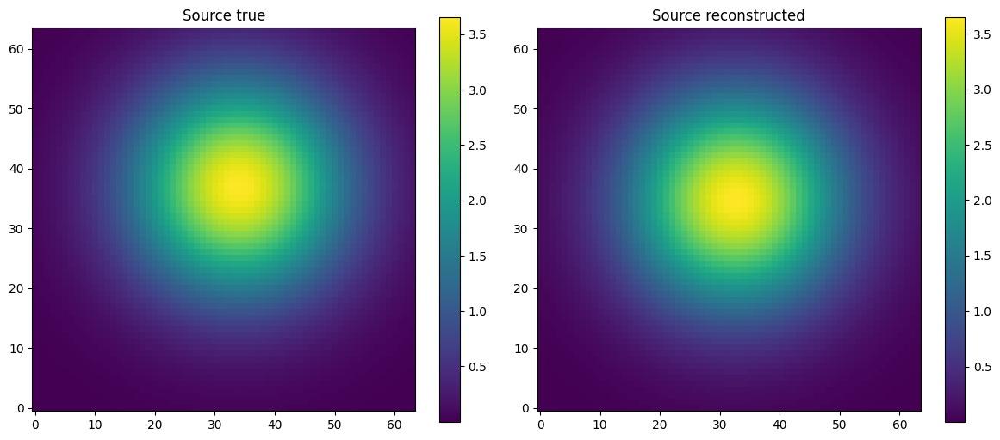

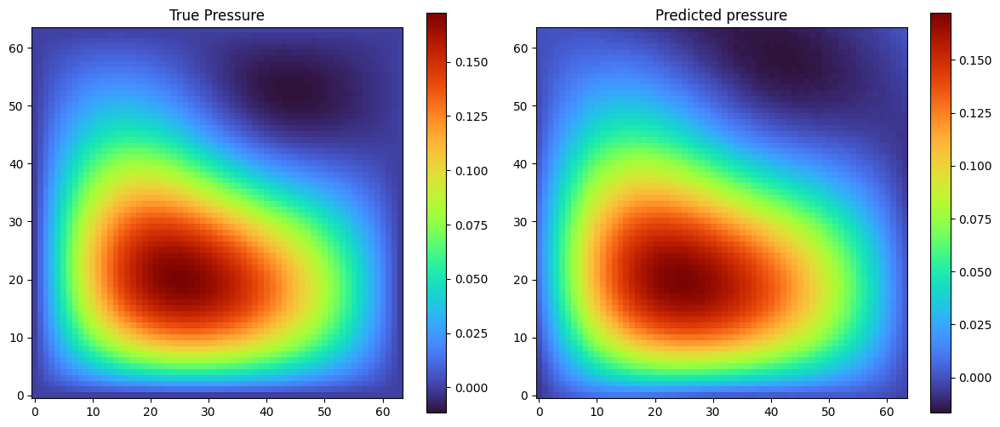

In [22]:

for i in range(1):
    sample = i
    
    loss_test, l2_error, s_pred, source_rec, l2_error_source, source_true, perm_pred_all, perm_test = loss_test_l2_error(model_fn, model_inv_fn, params, X_test[sample].reshape(1,-1), y_test[sample].reshape(1,-1), solutions_xy, param_test[sample].reshape(1,-1), return_data=True)
    
    A_t = perm_test[0,0]
    x_t = perm_test[0,1]
    y_t = perm_test[0,2]
    
    A_pred = perm_pred_all[0,0]
    x_pred = perm_pred_all[0,1]
    y_pred = perm_pred_all[0,2]
    
    print("A_t: ", A_t)
    print("x_t: ", x_t)
    print("y_t: ", y_t)

    print("A_pred: ", A_pred)
    print("x_pred: ", x_pred)
    print("y_pred: ", y_pred)

    # Absolute errors
    A_err = jnp.abs(A_t - A_pred)
    x_err = jnp.abs(x_t - x_pred)
    y_err = jnp.abs(y_t - y_pred)

    print("\nAbsolute Error A:", A_err)
    print("Absolute Error x:", x_err)
    print("Absolute Error y:", y_err)

    
    print("sample: ", sample)
    print("l2_error: ", l2_error)
    print("mse_error: ", loss_test)
    
    source_true_i = source_true[0]
    source_rec_i = source_rec[0]
    
    
    source_true_i = source_true_i.reshape(64, 64)
    source_rec_i = source_rec_i.reshape(64, 64)

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    im1 = axes[0].imshow(source_true_i, origin='lower', cmap='viridis')
    axes[0].set_title('Source true')
    plt.colorbar(im1, ax=axes[0])

    im2 = axes[1].imshow(source_rec_i, origin='lower', cmap='viridis')
    axes[1].set_title('Source reconstructed')
    plt.colorbar(im2, ax=axes[1])

    plt.tight_layout()
    plt.show()
    
    s_pred = s_pred[0]
    y_test_i = y_test[sample].reshape(64, 64)
    s_pred_i = s_pred.reshape(64, 64)

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    im1 = axes[0].imshow(y_test_i, origin='lower', cmap='turbo')
    axes[0].set_title('True Pressure')
    plt.colorbar(im1, ax=axes[0])

    im2 = axes[1].imshow(s_pred_i, origin='lower', cmap='turbo')
    axes[1].set_title('Predicted pressure')
    plt.colorbar(im2, ax=axes[1])

    plt.tight_layout()
    plt.show()
    
    



Sample: 0
Solution L2 error: 1.121717e-01
Solution MSE: 1.853196e-04
Source L2 error: 2.395537e-01
A_t:  5.659957
x_t:  0.45346412
y_t:  0.6251717
A_pred:  5.0823283
x_pred:  0.46861798
y_pred:  0.5611671

Absolute Error A: 0.5776286
Absolute Error x: 0.015153855
Absolute Error y: 0.0640046


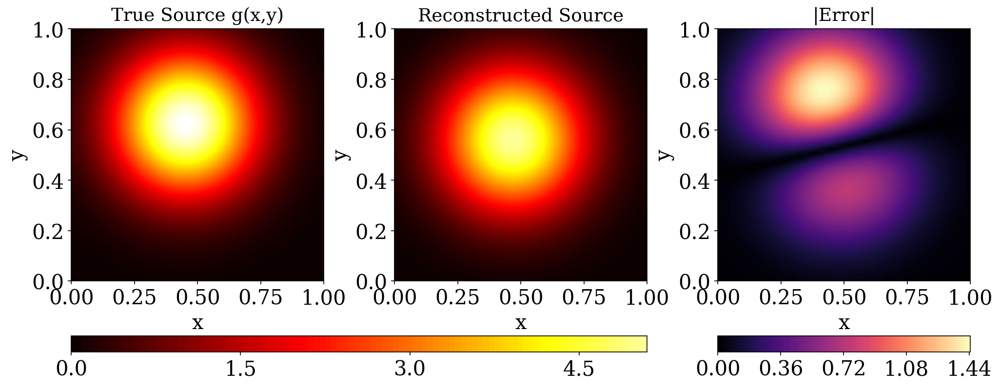

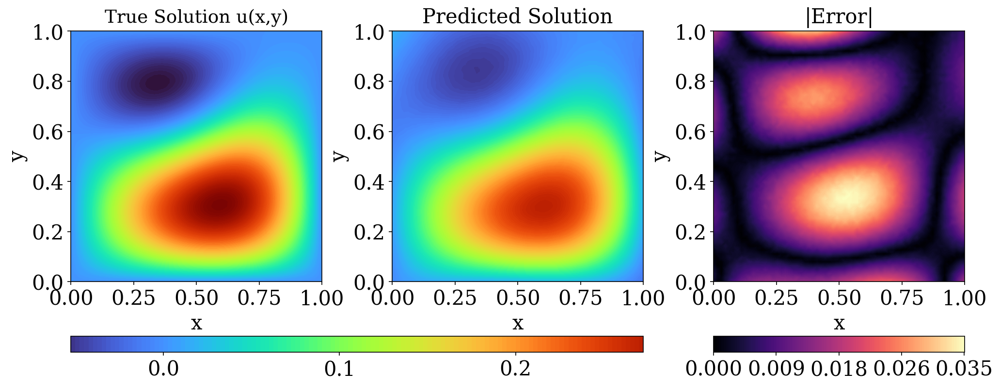



Sample: 1
Solution L2 error: 1.218611e-01
Solution MSE: 3.513828e-05
Source L2 error: 2.358022e-01
A_t:  2.448193
x_t:  0.5237448
y_t:  0.40311074
A_pred:  2.4771516
x_pred:  0.5192353
y_pred:  0.46993145

Absolute Error A: 0.028958559
Absolute Error x: 0.0045095086
Absolute Error y: 0.06682071


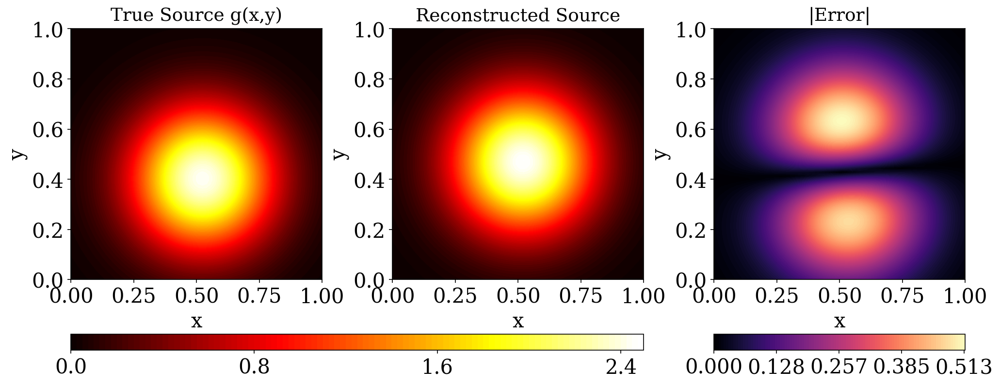

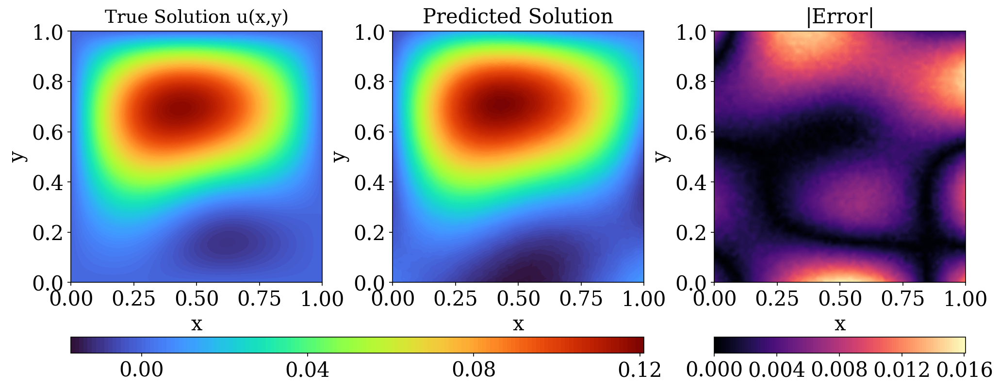



Sample: 2
Solution L2 error: 2.027470e-01
Solution MSE: 5.673353e-04
Source L2 error: 3.875547e-01
A_t:  5.3447328
x_t:  0.49493325
y_t:  0.3527956
A_pred:  4.374111
x_pred:  0.50165117
y_pred:  0.46277565

Absolute Error A: 0.9706216
Absolute Error x: 0.0067179203
Absolute Error y: 0.10998005


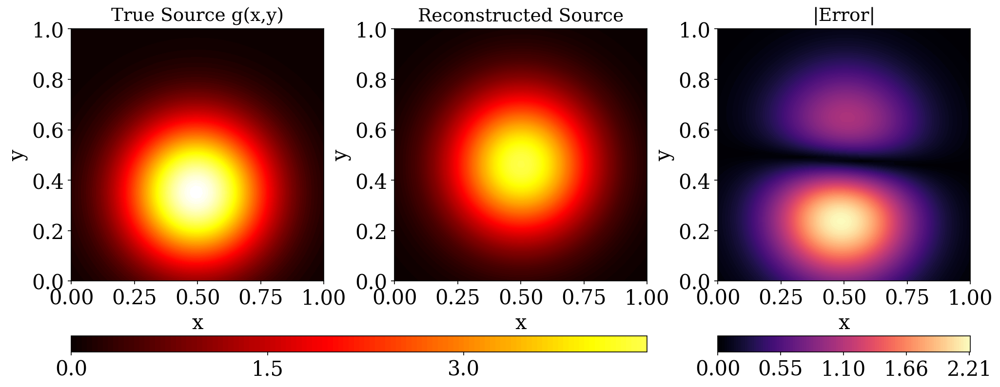

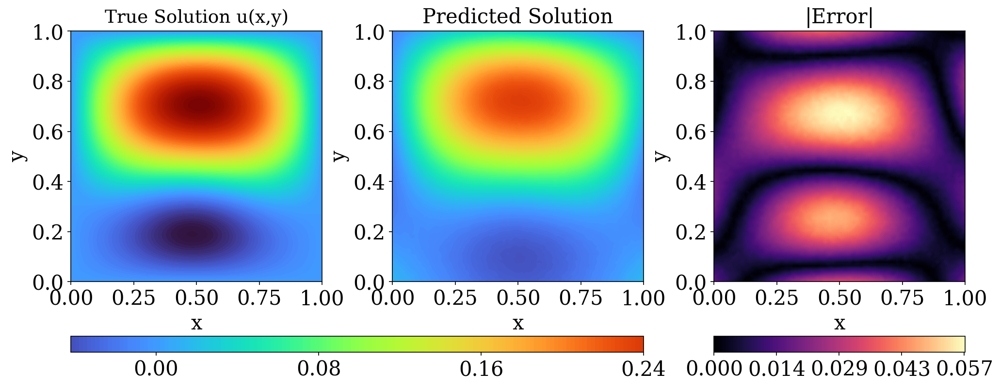



Sample: 3
Solution L2 error: 6.788556e-02
Solution MSE: 1.713248e-05
Source L2 error: 1.262100e-01
A_t:  3.1799364
x_t:  0.5009263
y_t:  0.5842395
A_pred:  3.2203715
x_pred:  0.49518955
y_pred:  0.5491854

Absolute Error A: 0.040435076
Absolute Error x: 0.0057367682
Absolute Error y: 0.035054088


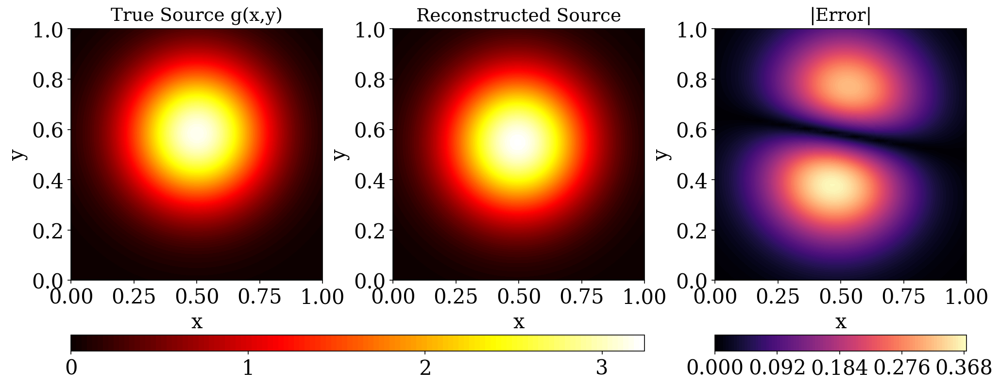

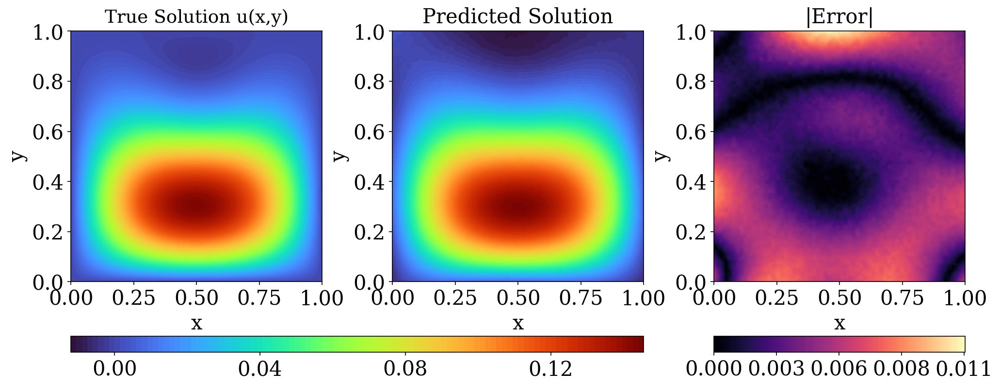



Sample: 4
Solution L2 error: 1.486653e-01
Solution MSE: 3.820459e-04
Source L2 error: 3.205494e-01
A_t:  5.6407824
x_t:  0.39484668
y_t:  0.63997966
A_pred:  4.8669896
x_pred:  0.43970722
y_pred:  0.561571

Absolute Error A: 0.77379274
Absolute Error x: 0.04486054
Absolute Error y: 0.07840866


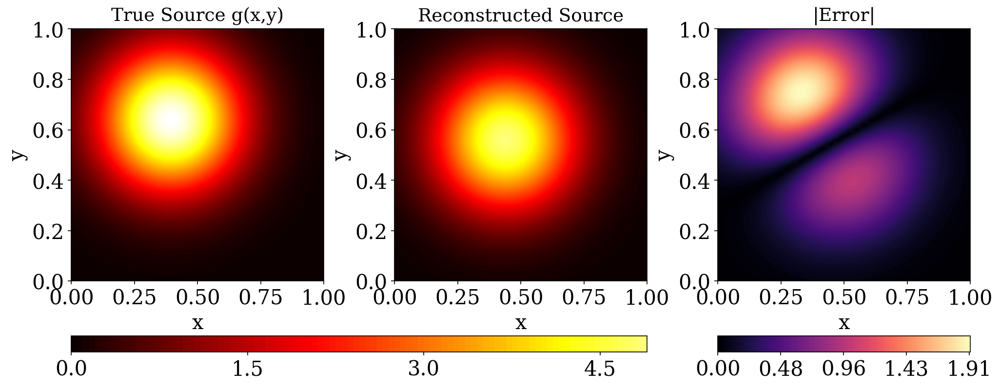

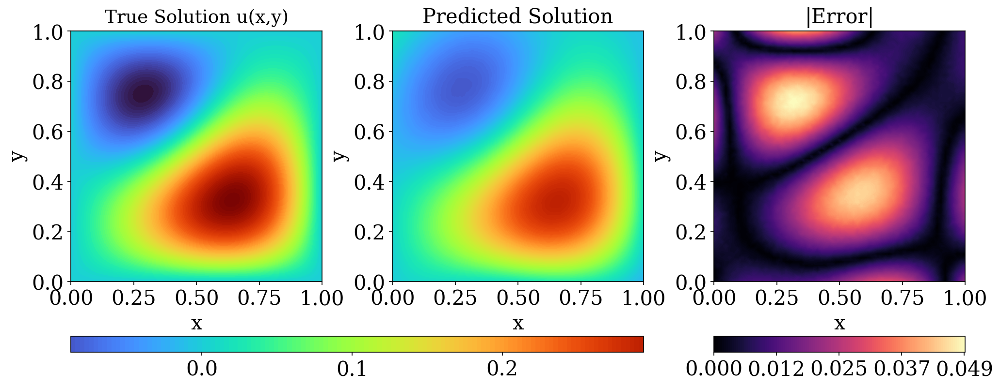



Sample: 5
Solution L2 error: 6.848086e-02
Solution MSE: 5.391802e-05
Source L2 error: 1.314416e-01
A_t:  5.670392
x_t:  0.42454198
y_t:  0.5192658
A_pred:  5.248064
x_pred:  0.45651895
y_pred:  0.51664793

Absolute Error A: 0.422328
Absolute Error x: 0.031976968
Absolute Error y: 0.002617836


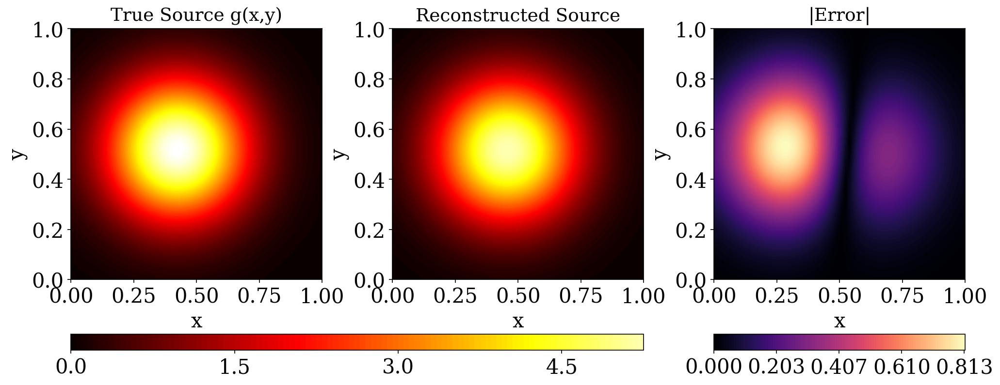

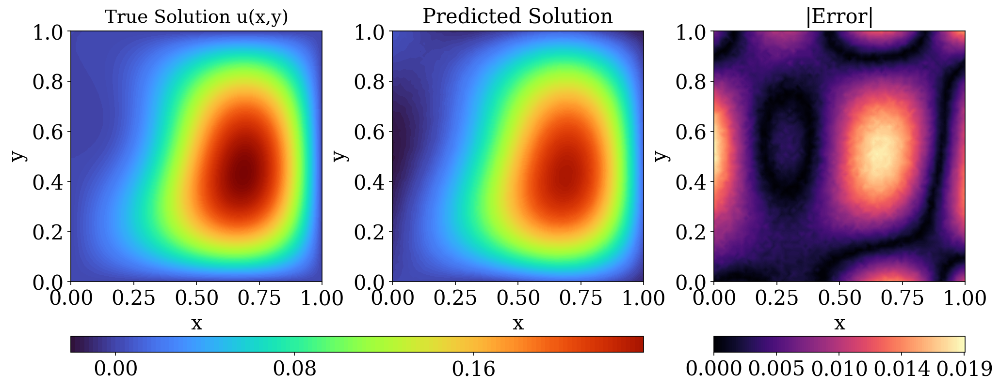



Sample: 6
Solution L2 error: 9.353107e-02
Solution MSE: 2.471006e-05
Source L2 error: 1.679621e-01
A_t:  2.5879297
x_t:  0.58958715
y_t:  0.5691833
A_pred:  2.6058903
x_pred:  0.546468
y_pred:  0.5488199

Absolute Error A: 0.017960548
Absolute Error x: 0.043119133
Absolute Error y: 0.02036339


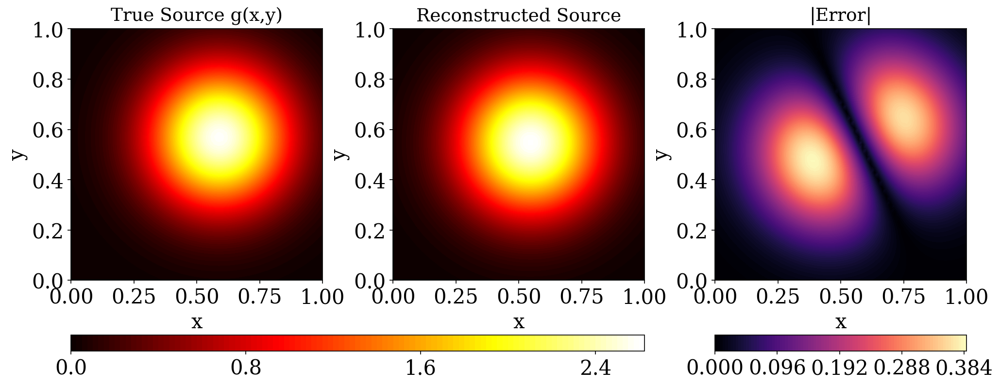

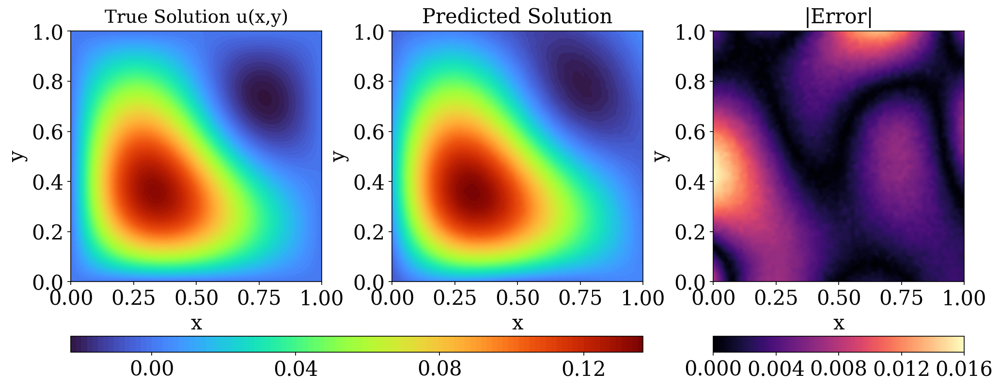



Sample: 7
Solution L2 error: 8.637197e-02
Solution MSE: 4.836243e-05
Source L2 error: 2.558061e-01
A_t:  3.692808
x_t:  0.5076536
y_t:  0.64285004
A_pred:  3.5712678
x_pred:  0.4962181
y_pred:  0.5693947

Absolute Error A: 0.12154007
Absolute Error x: 0.011435509
Absolute Error y: 0.07345533


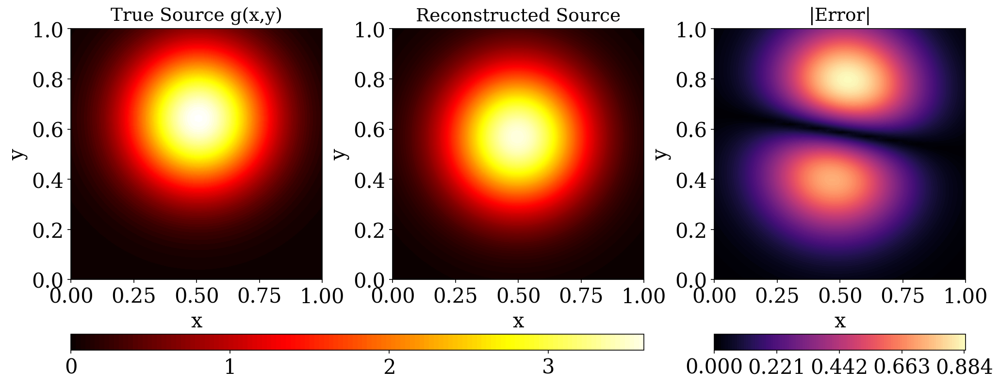

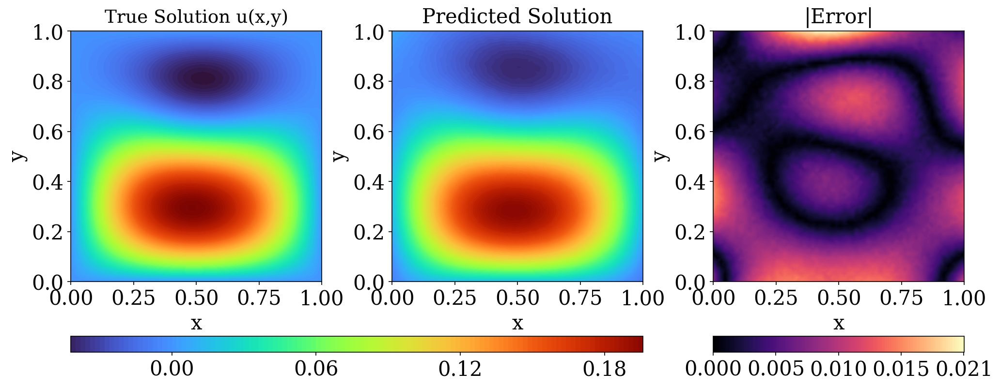



Sample: 8
Solution L2 error: 1.292027e-01
Solution MSE: 1.990971e-04
Source L2 error: 2.326507e-01
A_t:  5.6919217
x_t:  0.56415296
y_t:  0.44577342
A_pred:  4.9230623
x_pred:  0.5357952
y_pred:  0.49653763

Absolute Error A: 0.7688594
Absolute Error x: 0.028357744
Absolute Error y: 0.050764203


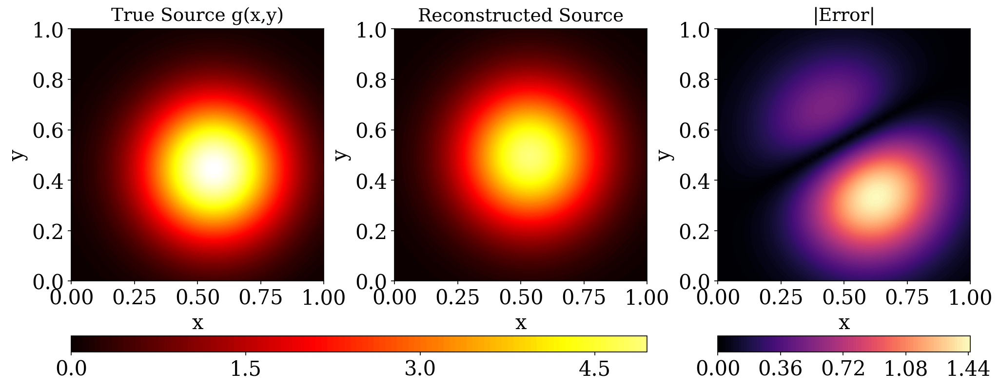

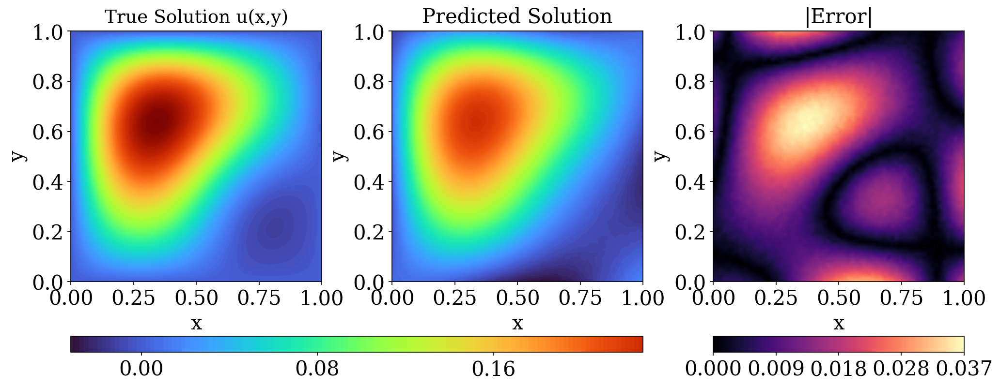



Sample: 9
Solution L2 error: 5.656662e-02
Solution MSE: 1.370590e-05
Source L2 error: 9.014680e-02
A_t:  3.5557625
x_t:  0.5296886
y_t:  0.55791676
A_pred:  3.6048262
x_pred:  0.5130751
y_pred:  0.5390761

Absolute Error A: 0.049063683
Absolute Error x: 0.016613483
Absolute Error y: 0.01884067


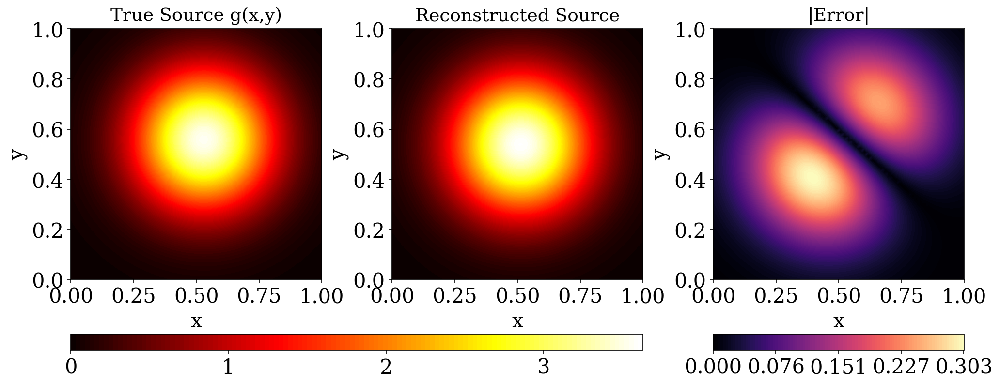

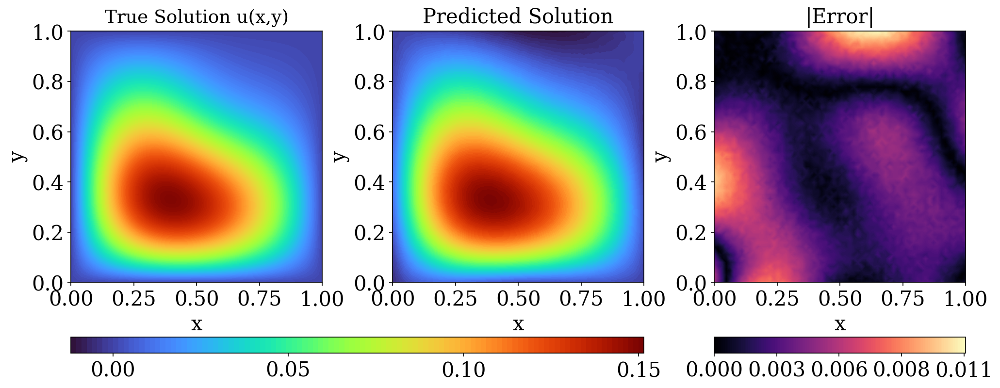

In [25]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.tri import Triangulation
from matplotlib.colors import Normalize

# Global fonts
tex_fonts = {
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
    "axes.titlesize": 18,
    "axes.labelsize": 16,
    "font.size": 14,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 14,
}
plt.rcParams.update(tex_fonts)

fontsize_com = 20
# ============================================================
# Create triangulation for 64x64 grid (do this once)
# ============================================================
n_grid = 64
x_grid = np.linspace(0, 1, n_grid)
y_grid = np.linspace(0, 1, n_grid)
X_grid, Y_grid = np.meshgrid(x_grid, y_grid)
x_flat = X_grid.flatten()
y_flat = Y_grid.flatten()
tri_grid = Triangulation(x_flat, y_flat)

# ============================================================
# Main loop
# ============================================================
for i in range(10):
    sample = i
    
    loss_test, l2_error, s_pred, source_rec, l2_error_source, source_true, perm_pred_all, perm_test = loss_test_l2_error(
        model_fn, model_inv_fn, params, 
        X_test[sample].reshape(1,-1), 
        y_test[sample].reshape(1,-1), 
        solutions_xy, 
        param_test[sample].reshape(1,-1), 
        return_data=True
    )
    
    print(f"\n{'='*70}")
    print(f"Sample: {sample}")
    print(f"{'='*70}")
    print(f"Solution L2 error: {l2_error:.6e}")
    print(f"Solution MSE: {loss_test:.6e}")
    print(f"Source L2 error: {l2_error_source:.6e}")
    
    A_t = perm_test[0,0]
    x_t = perm_test[0,1]
    y_t = perm_test[0,2]
    
    A_pred = perm_pred_all[0,0]
    x_pred = perm_pred_all[0,1]
    y_pred = perm_pred_all[0,2]
    
    print("A_t: ", A_t)
    print("x_t: ", x_t)
    print("y_t: ", y_t)

    print("A_pred: ", A_pred)
    print("x_pred: ", x_pred)
    print("y_pred: ", y_pred)

    # Absolute errors
    A_err = jnp.abs(A_t - A_pred)
    x_err = jnp.abs(x_t - x_pred)
    y_err = jnp.abs(y_t - y_pred)

    print("\nAbsolute Error A:", A_err)
    print("Absolute Error x:", x_err)
    print("Absolute Error y:", y_err)
    
    # Reshape data to 2D
    source_true_i = source_true[0].reshape(64, 64)
    source_rec_i = source_rec[0].reshape(64, 64)
    y_test_i = y_test[sample].reshape(64, 64)
    s_pred_i = s_pred[0].reshape(64, 64)
    
    # Flatten for tricontourf
    source_true_flat = source_true_i.flatten()
    source_rec_flat = source_rec_i.flatten()
    y_test_flat = y_test_i.flatten()
    s_pred_flat = s_pred_i.flatten()
    
    # Compute errors
    source_error = np.abs(source_rec_i - source_true_i)
    solution_error = np.abs(s_pred_i - y_test_i)
    source_error_flat = source_error.flatten()
    solution_error_flat = solution_error.flatten()
    
    # ============================================================
    # PLOT 1: SOURCE COMPARISON
    # ============================================================
    fig1 = plt.figure(figsize=(18, 6.5), dpi=150)
    gs1 = fig1.add_gridspec(2, 4, height_ratios=[20, 1], width_ratios=[1, 1, 1, 0.2],
                            hspace=0.1, wspace=0.35, top=0.88, bottom=0.12)
    
    # Axes for plots
    ax_src_true = fig1.add_subplot(gs1[0, 0])
    ax_src_rec = fig1.add_subplot(gs1[0, 1])
    ax_src_err = fig1.add_subplot(gs1[0, 2])
    
    # Axes for colorbars
    cax_src = fig1.add_subplot(gs1[1, 0:2])
    cax_src_err = fig1.add_subplot(gs1[1, 2])
    
    # Normalizations
    src_min = min(source_true_flat.min(), source_rec_flat.min())
    src_max = max(source_true_flat.max(), source_rec_flat.max())
    src_norm = Normalize(vmin=src_min, vmax=src_max)
    
    err_src_min = source_error_flat.min()
    err_src_max = source_error_flat.max()
    
    # Plot 1: True Source
    im1 = ax_src_true.tricontourf(tri_grid, source_true_flat, levels=120, 
                                   cmap='hot', norm=src_norm)
    ax_src_true.set_title('True Source g(x,y)', fontsize=18, pad=8)
    ax_src_true.set_xlabel('x', fontsize=fontsize_com)
    ax_src_true.set_ylabel('y', fontsize=fontsize_com)
    ax_src_true.set_aspect('equal')
    ax_src_true.set_xlim(0, 1)
    ax_src_true.set_ylim(0, 1)
    ax_src_true.tick_params(labelsize=fontsize_com)
    
    # Plot 2: Reconstructed Source
    im2 = ax_src_rec.tricontourf(tri_grid, source_rec_flat, levels=120, 
                                  cmap='hot', norm=src_norm)
    ax_src_rec.set_title('Reconstructed Source', fontsize=18, pad=8)
    ax_src_rec.set_xlabel('x', fontsize=fontsize_com)
    ax_src_rec.set_ylabel('y', fontsize=fontsize_com)
    ax_src_rec.set_aspect('equal')
    ax_src_rec.set_xlim(0, 1)
    ax_src_rec.set_ylim(0, 1)
    ax_src_rec.tick_params(labelsize=fontsize_com)
    
    # Plot 3: Source Error
    im3 = ax_src_err.tricontourf(tri_grid, source_error_flat, levels=120, 
                                  cmap='magma')
    # ax_src_err.tricontour(tri_grid, source_error_flat, levels=12, 
    #                       linewidths=0.4, colors='k', alpha=0.15)
    ax_src_err.set_title('|Error|', fontsize=18, pad=8)
    ax_src_err.set_xlabel('x', fontsize=fontsize_com)
    ax_src_err.set_ylabel('y', fontsize=fontsize_com)
    ax_src_err.set_aspect('equal')
    ax_src_err.set_xlim(0, 1)
    ax_src_err.set_ylim(0, 1)
    ax_src_err.tick_params(labelsize=fontsize_com)
    
    # Colorbars
    cbar1 = fig1.colorbar(im2, cax=cax_src, orientation='horizontal')
    # cbar1.set_label('Source intensity', fontsize=14)
    cbar1.ax.tick_params(labelsize=fontsize_com)
    cbar1.ax.xaxis.set_major_locator(ticker.MaxNLocator(nbins=4, prune=None))
    
    cbar2 = fig1.colorbar(im3, cax=cax_src_err, orientation='horizontal')
    # cbar2.set_label('|Error|', fontsize=16)
    cbar2.ax.tick_params(labelsize=fontsize_com)
    # Use explicit tick values
    tick_values = np.linspace(err_src_min, err_src_max, 5)
    cbar2.set_ticks(tick_values)
    # Format based on magnitude
    if err_src_max < 0.01:
        cbar2.ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, p: f'{x:.2e}'))
    elif err_src_max < 1:
        cbar2.ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, p: f'{x:.3f}'))
    else:
        cbar2.ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, p: f'{x:.2f}'))
    
    # Add main title with proper spacing
    # fig1.suptitle(f'Sample #{sample} - Source Comparison', fontsize=20, fontweight='bold', y=0.96)
    
    plt.show()
    
    # ============================================================
    # PLOT 2: SOLUTION COMPARISON
    # ============================================================
    fig2 = plt.figure(figsize=(18, 6.5), dpi=150)
    gs2 = fig2.add_gridspec(2, 4, height_ratios=[20, 1], width_ratios=[1, 1, 1, 0.2],
                            hspace=0.1, wspace=0.35, top=0.88, bottom=0.12)
    
    # Axes for plots
    ax_sol_true = fig2.add_subplot(gs2[0, 0])
    ax_sol_pred = fig2.add_subplot(gs2[0, 1])
    ax_sol_err = fig2.add_subplot(gs2[0, 2])
    
    # Axes for colorbars
    cax_sol = fig2.add_subplot(gs2[1, 0:2])
    cax_sol_err = fig2.add_subplot(gs2[1, 2])
    
    # Normalizations
    sol_min = min(y_test_flat.min(), s_pred_flat.min())
    sol_max = max(y_test_flat.max(), s_pred_flat.max())
    sol_norm = Normalize(vmin=sol_min, vmax=sol_max)
    
    err_sol_min = solution_error_flat.min()
    err_sol_max = solution_error_flat.max()
    
    # Plot 1: True Solution
    im4 = ax_sol_true.tricontourf(tri_grid, y_test_flat, levels=150, 
                                   cmap='turbo', norm=sol_norm)
    ax_sol_true.set_title('True Solution u(x,y)', fontsize=18, pad=8)
    ax_sol_true.set_xlabel('x', fontsize=fontsize_com)
    ax_sol_true.set_ylabel('y', fontsize=fontsize_com)
    ax_sol_true.set_aspect('equal')
    ax_sol_true.set_xlim(0, 1)
    ax_sol_true.set_ylim(0, 1)
    ax_sol_true.tick_params(labelsize=fontsize_com)
    
    # Plot 2: Predicted Solution
    im5 = ax_sol_pred.tricontourf(tri_grid, s_pred_flat, levels=150, 
                                   cmap='turbo', norm=sol_norm)
    ax_sol_pred.set_title('Predicted Solution', fontsize=fontsize_com, pad=8)
    ax_sol_pred.set_xlabel('x', fontsize=fontsize_com)
    ax_sol_pred.set_ylabel('y', fontsize=fontsize_com)
    ax_sol_pred.set_aspect('equal')
    ax_sol_pred.set_xlim(0, 1)
    ax_sol_pred.set_ylim(0, 1)
    ax_sol_pred.tick_params(labelsize=fontsize_com)
    
    # Plot 3: Solution Error
    im6 = ax_sol_err.tricontourf(tri_grid, solution_error_flat, levels=150, 
                                  cmap='magma')
    # ax_sol_err.tricontour(tri_grid, solution_error_flat, levels=12, 
    #                       linewidths=0.4, colors='k', alpha=0.15)
    ax_sol_err.set_title('|Error|', fontsize=fontsize_com, pad=8)
    ax_sol_err.set_xlabel('x', fontsize=fontsize_com)
    ax_sol_err.set_ylabel('y', fontsize=fontsize_com)
    ax_sol_err.set_aspect('equal')
    ax_sol_err.set_xlim(0, 1)
    ax_sol_err.set_ylim(0, 1)
    ax_sol_err.tick_params(labelsize=fontsize_com)
    
    # Colorbars
    cbar3 = fig2.colorbar(im5, cax=cax_sol, orientation='horizontal')
    # cbar3.set_label('Solution u(x,y)', fontsize=16)
    cbar3.ax.tick_params(labelsize=fontsize_com)
    cbar3.ax.xaxis.set_major_locator(ticker.MaxNLocator(nbins=4, prune=None))
    
    cbar4 = fig2.colorbar(im6, cax=cax_sol_err, orientation='horizontal')
    # cbar4.set_label('|Error|', fontsize=16)
    cbar4.ax.tick_params(labelsize=fontsize_com)
    # Use explicit tick values
    tick_values = np.linspace(err_sol_min, err_sol_max, 5)
    cbar4.set_ticks(tick_values)
    # Format based on magnitude
    if err_sol_max < 0.01:
        cbar4.ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, p: f'{x:.2e}'))
    elif err_sol_max < 1:
        cbar4.ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, p: f'{x:.3f}'))
    else:
        cbar4.ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, p: f'{x:.2f}'))
    
    # Add main title with proper spacing
    # fig2.suptitle(f'Sample #{sample} - Solution Comparison', fontsize=20, fontweight='bold', y=0.96)
    
    plt.show()
    
    print(f"{'='*70}\n")


Sample: 0
Solution L2 error: 1.121717e-01
Solution MSE: 1.853196e-04
Source L2 error: 2.395537e-01
A_t:  5.659957
x_t:  0.45346412
y_t:  0.6251717
A_pred:  5.0823283
x_pred:  0.46861798
y_pred:  0.5611671

Absolute Error A: 0.5776286
Absolute Error x: 0.015153855
Absolute Error y: 0.0640046


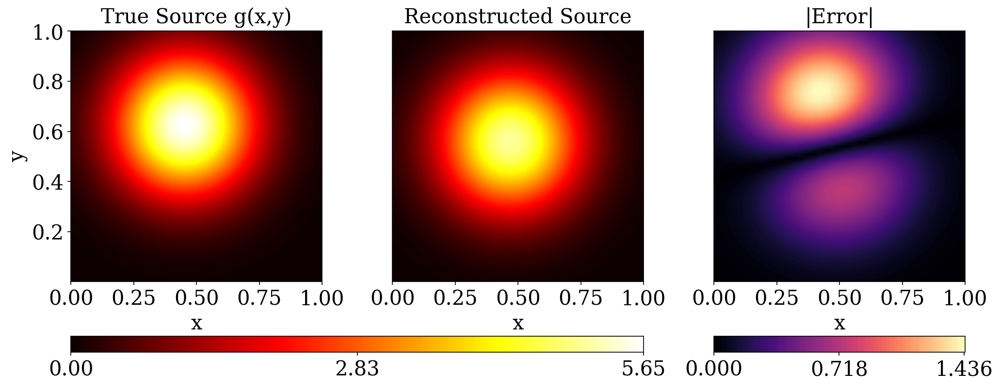

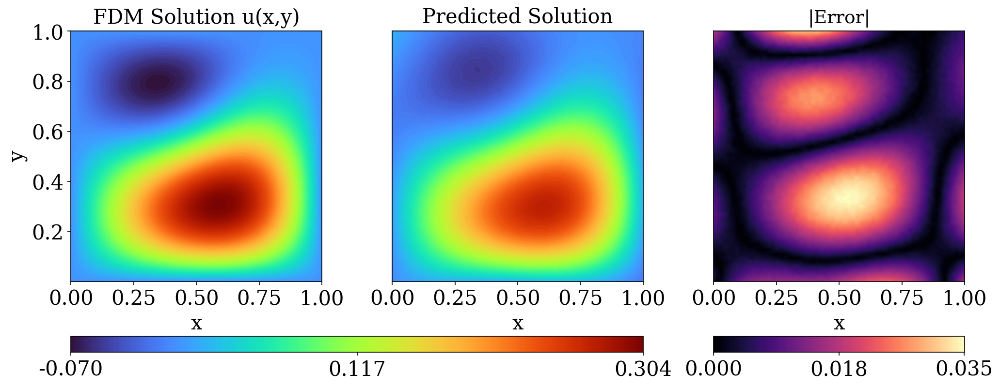

Saved: paper_plots/source_plot_sample_0.pdf
Saved: paper_plots/source_plot_sample_0.png
Saved: paper_plots/solution_plot_sample_0.pdf
Saved: paper_plots/solution_plot_sample_0.png


Sample: 1
Solution L2 error: 1.218611e-01
Solution MSE: 3.513828e-05
Source L2 error: 2.358022e-01
A_t:  2.448193
x_t:  0.5237448
y_t:  0.40311074
A_pred:  2.4771516
x_pred:  0.5192353
y_pred:  0.46993145

Absolute Error A: 0.028958559
Absolute Error x: 0.0045095086
Absolute Error y: 0.06682071


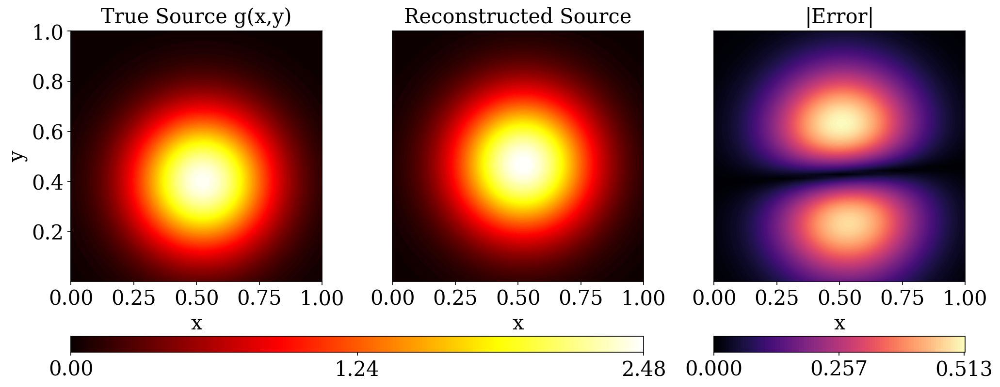

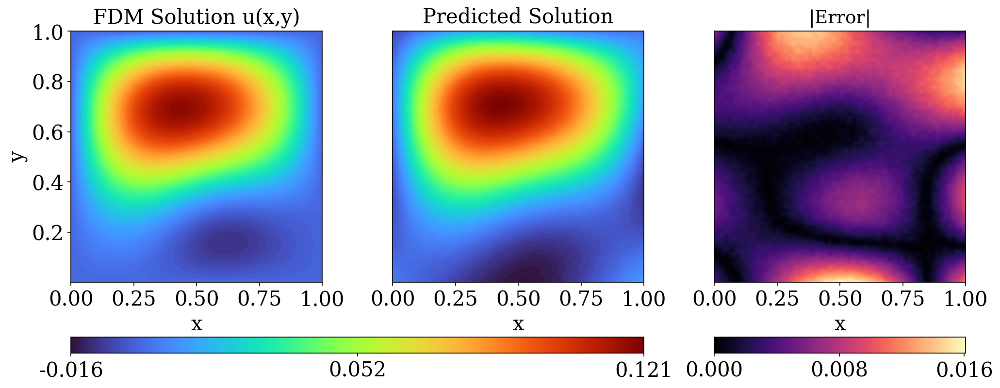

Saved: paper_plots/source_plot_sample_1.pdf
Saved: paper_plots/source_plot_sample_1.png
Saved: paper_plots/solution_plot_sample_1.pdf
Saved: paper_plots/solution_plot_sample_1.png


Sample: 2
Solution L2 error: 2.027470e-01
Solution MSE: 5.673353e-04
Source L2 error: 3.875547e-01
A_t:  5.3447328
x_t:  0.49493325
y_t:  0.3527956
A_pred:  4.374111
x_pred:  0.50165117
y_pred:  0.46277565

Absolute Error A: 0.9706216
Absolute Error x: 0.0067179203
Absolute Error y: 0.10998005


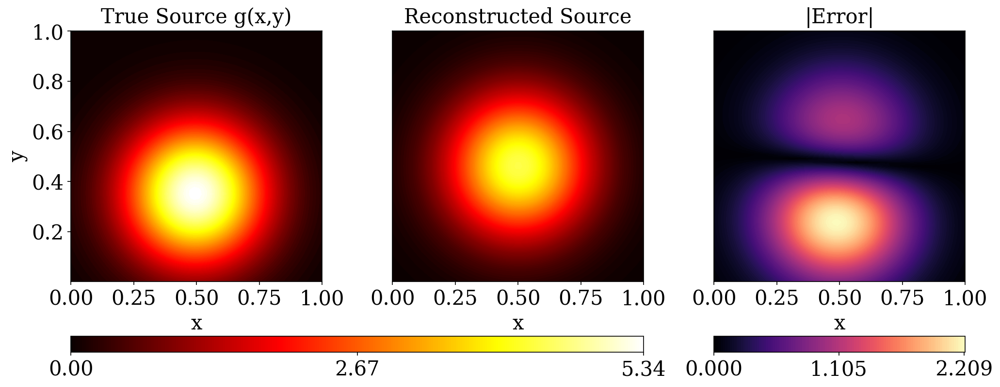

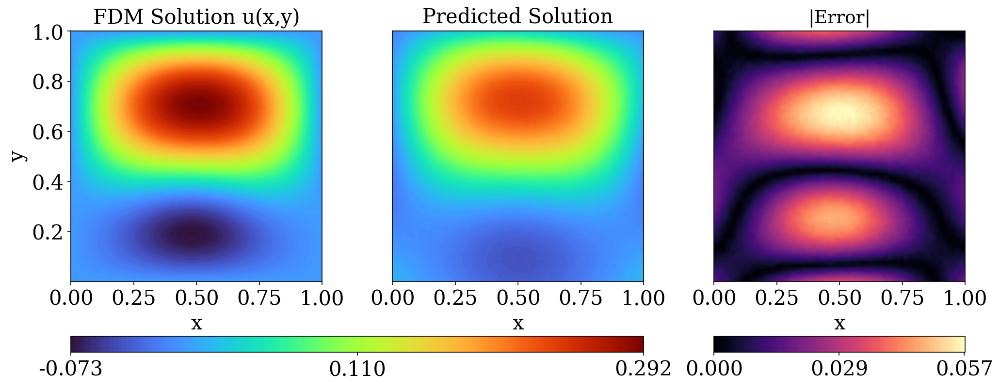

Saved: paper_plots/source_plot_sample_2.pdf
Saved: paper_plots/source_plot_sample_2.png
Saved: paper_plots/solution_plot_sample_2.pdf
Saved: paper_plots/solution_plot_sample_2.png


Sample: 3
Solution L2 error: 6.788556e-02
Solution MSE: 1.713248e-05
Source L2 error: 1.262100e-01
A_t:  3.1799364
x_t:  0.5009263
y_t:  0.5842395
A_pred:  3.2203715
x_pred:  0.49518955
y_pred:  0.5491854

Absolute Error A: 0.040435076
Absolute Error x: 0.0057367682
Absolute Error y: 0.035054088


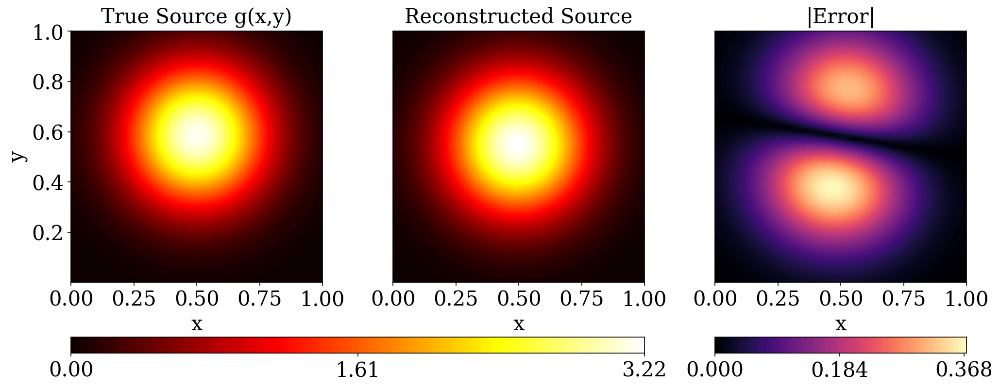

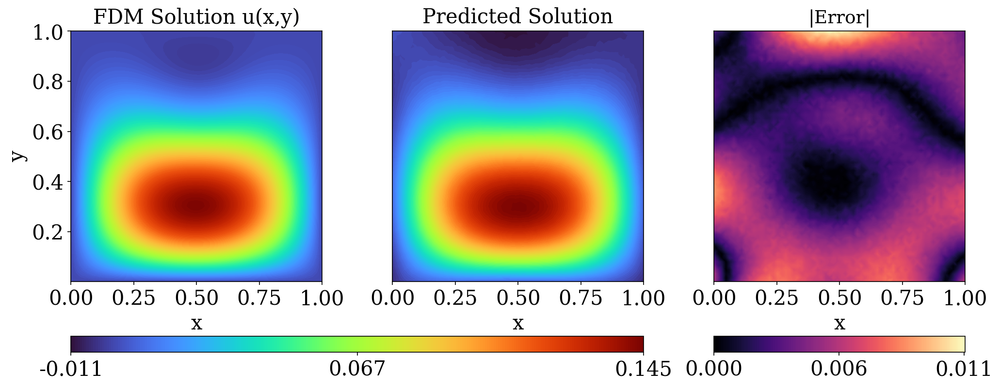

Saved: paper_plots/source_plot_sample_3.pdf
Saved: paper_plots/source_plot_sample_3.png
Saved: paper_plots/solution_plot_sample_3.pdf
Saved: paper_plots/solution_plot_sample_3.png


Sample: 4
Solution L2 error: 1.486653e-01
Solution MSE: 3.820459e-04
Source L2 error: 3.205494e-01
A_t:  5.6407824
x_t:  0.39484668
y_t:  0.63997966
A_pred:  4.8669896
x_pred:  0.43970722
y_pred:  0.561571

Absolute Error A: 0.77379274
Absolute Error x: 0.04486054
Absolute Error y: 0.07840866


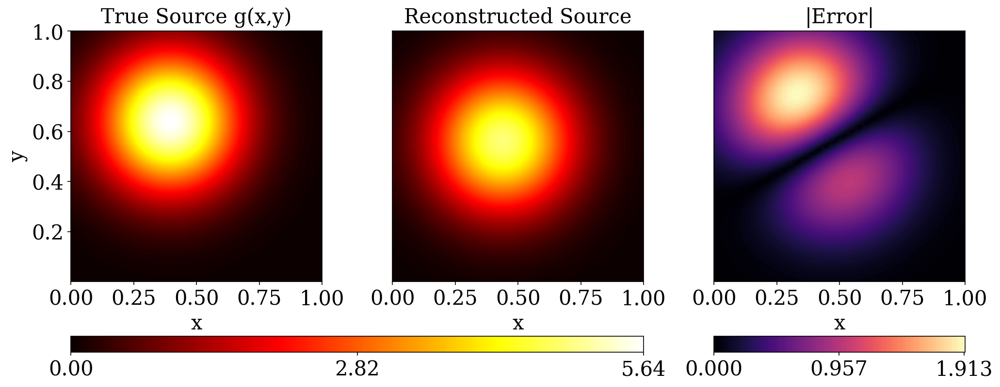

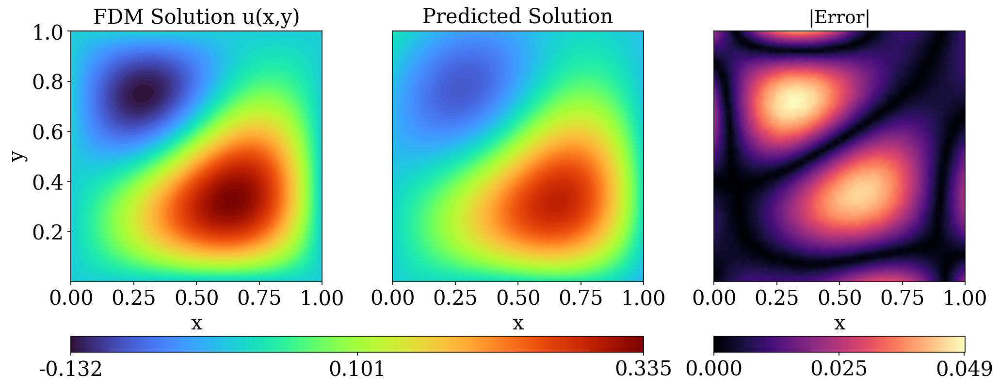

Saved: paper_plots/source_plot_sample_4.pdf
Saved: paper_plots/source_plot_sample_4.png
Saved: paper_plots/solution_plot_sample_4.pdf
Saved: paper_plots/solution_plot_sample_4.png


Sample: 5
Solution L2 error: 6.848086e-02
Solution MSE: 5.391802e-05
Source L2 error: 1.314416e-01
A_t:  5.670392
x_t:  0.42454198
y_t:  0.5192658
A_pred:  5.248064
x_pred:  0.45651895
y_pred:  0.51664793

Absolute Error A: 0.422328
Absolute Error x: 0.031976968
Absolute Error y: 0.002617836


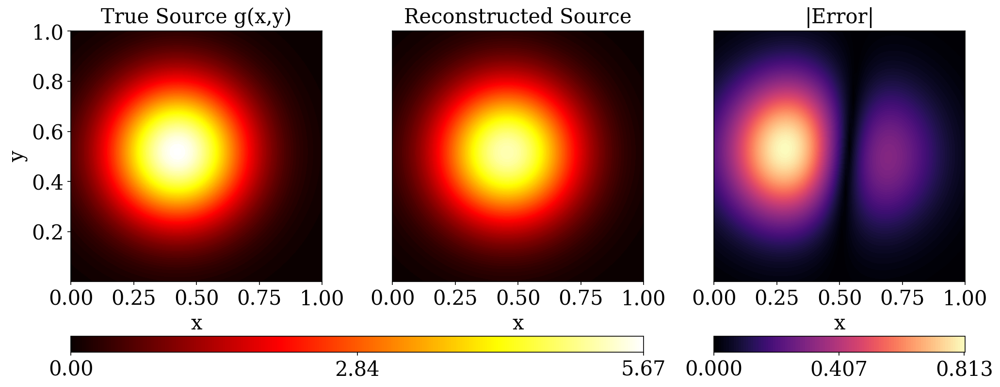

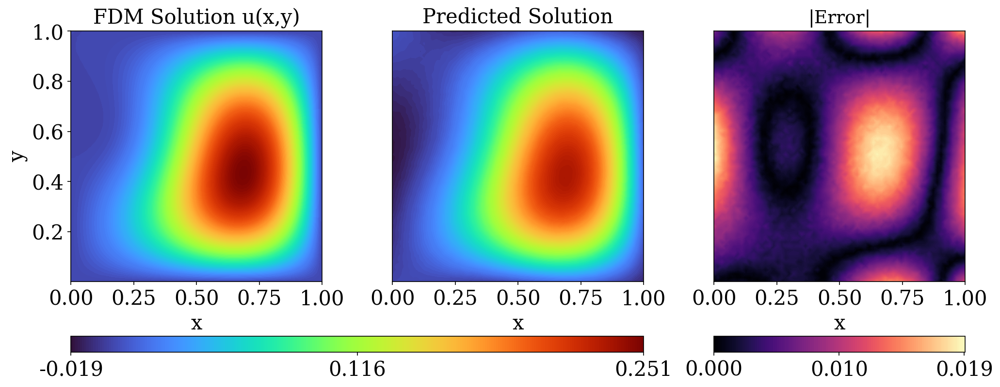

Saved: paper_plots/source_plot_sample_5.pdf
Saved: paper_plots/source_plot_sample_5.png
Saved: paper_plots/solution_plot_sample_5.pdf
Saved: paper_plots/solution_plot_sample_5.png


Sample: 6
Solution L2 error: 9.353107e-02
Solution MSE: 2.471006e-05
Source L2 error: 1.679621e-01
A_t:  2.5879297
x_t:  0.58958715
y_t:  0.5691833
A_pred:  2.6058903
x_pred:  0.546468
y_pred:  0.5488199

Absolute Error A: 0.017960548
Absolute Error x: 0.043119133
Absolute Error y: 0.02036339


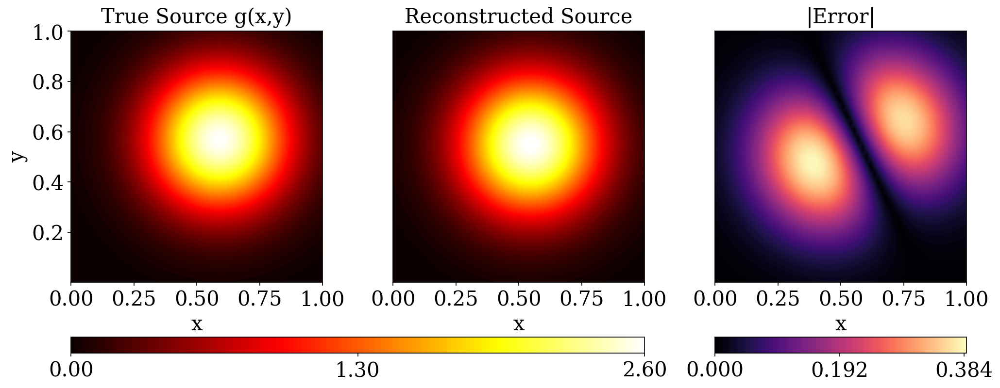

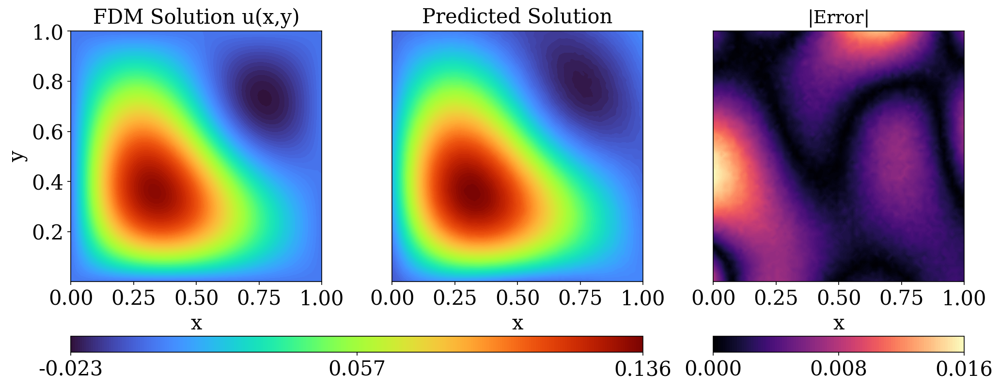

Saved: paper_plots/source_plot_sample_6.pdf
Saved: paper_plots/source_plot_sample_6.png
Saved: paper_plots/solution_plot_sample_6.pdf
Saved: paper_plots/solution_plot_sample_6.png


Sample: 7
Solution L2 error: 8.637197e-02
Solution MSE: 4.836243e-05
Source L2 error: 2.558061e-01
A_t:  3.692808
x_t:  0.5076536
y_t:  0.64285004
A_pred:  3.5712678
x_pred:  0.4962181
y_pred:  0.5693947

Absolute Error A: 0.12154007
Absolute Error x: 0.011435509
Absolute Error y: 0.07345533


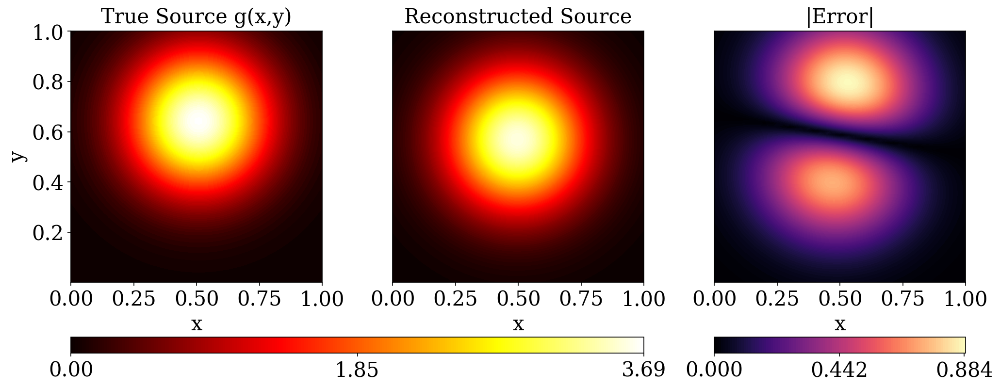

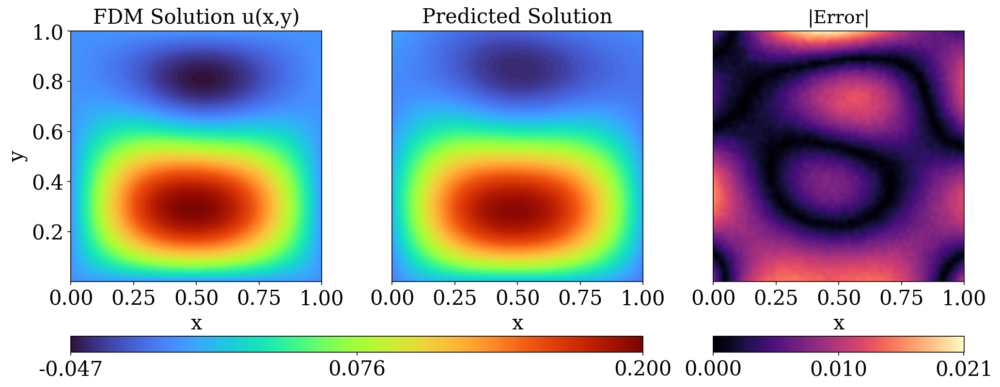

Saved: paper_plots/source_plot_sample_7.pdf
Saved: paper_plots/source_plot_sample_7.png
Saved: paper_plots/solution_plot_sample_7.pdf
Saved: paper_plots/solution_plot_sample_7.png


Sample: 8
Solution L2 error: 1.292027e-01
Solution MSE: 1.990971e-04
Source L2 error: 2.326507e-01
A_t:  5.6919217
x_t:  0.56415296
y_t:  0.44577342
A_pred:  4.9230623
x_pred:  0.5357952
y_pred:  0.49653763

Absolute Error A: 0.7688594
Absolute Error x: 0.028357744
Absolute Error y: 0.050764203


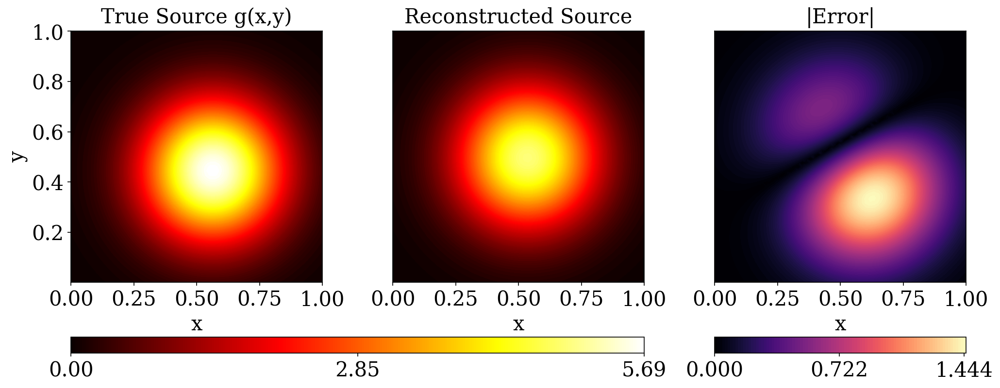

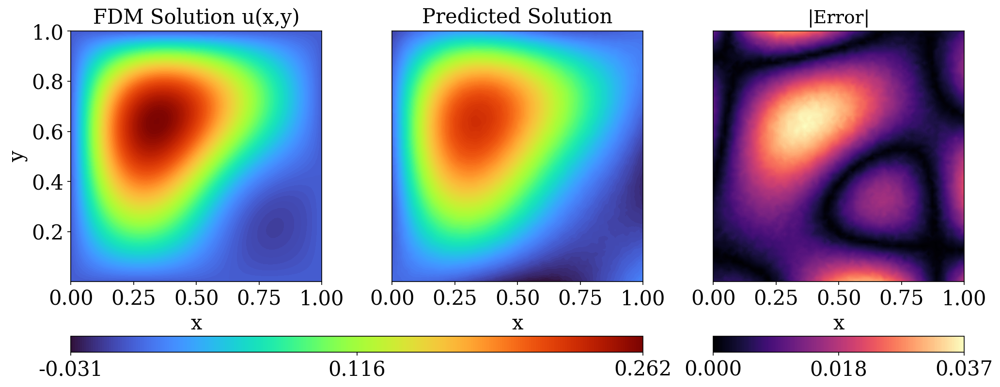

Saved: paper_plots/source_plot_sample_8.pdf
Saved: paper_plots/source_plot_sample_8.png
Saved: paper_plots/solution_plot_sample_8.pdf
Saved: paper_plots/solution_plot_sample_8.png


Sample: 9
Solution L2 error: 5.656662e-02
Solution MSE: 1.370590e-05
Source L2 error: 9.014680e-02
A_t:  3.5557625
x_t:  0.5296886
y_t:  0.55791676
A_pred:  3.6048262
x_pred:  0.5130751
y_pred:  0.5390761

Absolute Error A: 0.049063683
Absolute Error x: 0.016613483
Absolute Error y: 0.01884067


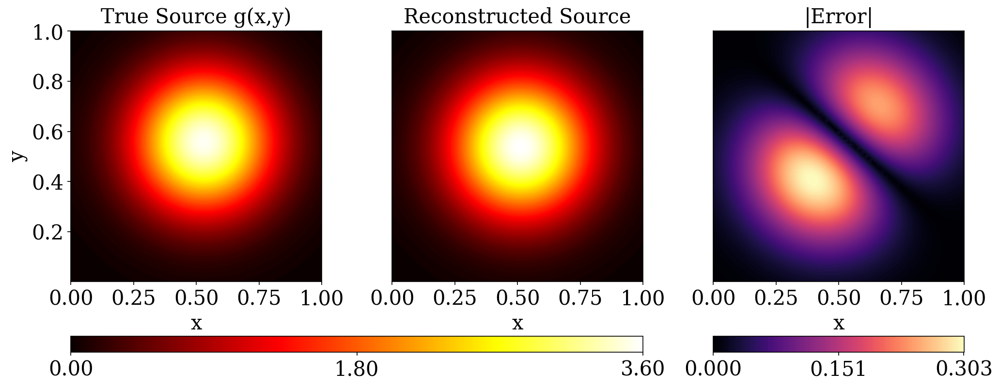

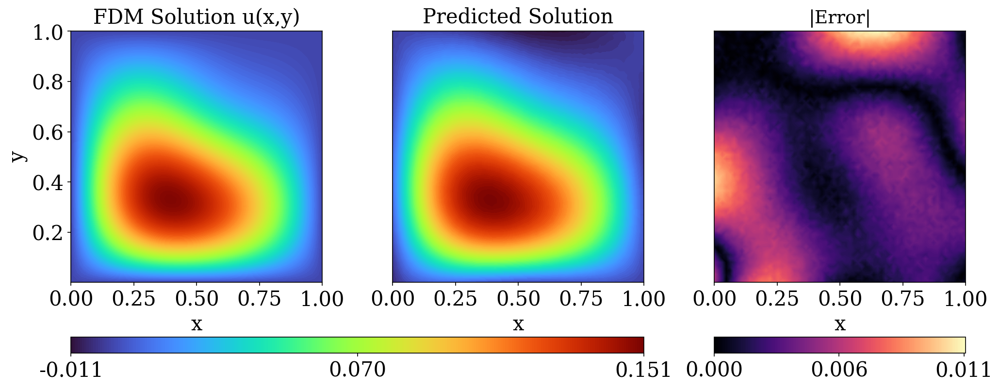

Saved: paper_plots/source_plot_sample_9.pdf
Saved: paper_plots/source_plot_sample_9.png
Saved: paper_plots/solution_plot_sample_9.pdf
Saved: paper_plots/solution_plot_sample_9.png



In [39]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.tri import Triangulation
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

import os

save_dir = "paper_plots"
os.makedirs(save_dir, exist_ok=True)

# Global fonts
tex_fonts = {
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
    "axes.titlesize": 18,
    "axes.labelsize": 16,
    "font.size": 14,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 14,
}
plt.rcParams.update(tex_fonts)

fontsize_com = 20

# ============================================================
# Create triangulation for 64x64 grid (do this once)
# ============================================================
n_grid = 64
x_grid = np.linspace(0, 1, n_grid)
y_grid = np.linspace(0, 1, n_grid)
X_grid, Y_grid = np.meshgrid(x_grid, y_grid)
x_flat = X_grid.flatten()
y_flat = Y_grid.flatten()
tri_grid = Triangulation(x_flat, y_flat)

# ============================================================
# Main loop
# ============================================================
for i in range(10):
    sample = i
    
    loss_test, l2_error, s_pred, source_rec, l2_error_source, source_true, perm_pred_all, perm_test = loss_test_l2_error(
        model_fn, model_inv_fn, params, 
        X_test[sample].reshape(1,-1), 
        y_test[sample].reshape(1,-1), 
        solutions_xy, 
        param_test[sample].reshape(1,-1), 
        return_data=True
    )
    
    print("\n" + "="*70)
    print(f"Sample: {sample}")
    print("="*70)
    print(f"Solution L2 error: {l2_error:.6e}")
    print(f"Solution MSE: {loss_test:.6e}")
    print(f"Source L2 error: {l2_error_source:.6e}")
    
    A_t = perm_test[0,0]
    x_t = perm_test[0,1]
    y_t = perm_test[0,2]
    
    A_pred = perm_pred_all[0,0]
    x_pred = perm_pred_all[0,1]
    y_pred = perm_pred_all[0,2]
    
    print("A_t: ", A_t)
    print("x_t: ", x_t)
    print("y_t: ", y_t)

    print("A_pred: ", A_pred)
    print("x_pred: ", x_pred)
    print("y_pred: ", y_pred)

    print("\nAbsolute Error A:", np.abs(A_t - A_pred))
    print("Absolute Error x:", np.abs(x_t - x_pred))
    print("Absolute Error y:", np.abs(y_t - y_pred))
    
    # Reshape to fields
    source_true_i = source_true[0].reshape(64, 64)
    source_rec_i = source_rec[0].reshape(64, 64)
    y_test_i = y_test[sample].reshape(64, 64)
    s_pred_i = s_pred[0].reshape(64, 64)

    # Flatten
    source_true_flat = source_true_i.flatten()
    source_rec_flat = source_rec_i.flatten()
    y_test_flat = y_test_i.flatten()
    s_pred_flat = s_pred_i.flatten()

    # Errors
    source_error = np.abs(source_rec_i - source_true_i)
    solution_error = np.abs(s_pred_i - y_test_i)
    source_error_flat = source_error.flatten()
    solution_error_flat = solution_error.flatten()

    # ============================================================
    # PLOT 1: SOURCE COMPARISON
    # ============================================================
    fig1 = plt.figure(figsize=(18, 6.5), dpi=150)
    gs1 = fig1.add_gridspec(2, 4, height_ratios=[20, 1], width_ratios=[1, 1, 1, 0.2],
                            hspace=0.1, wspace=0.35, top=0.88, bottom=0.12)
    
    ax_src_true = fig1.add_subplot(gs1[0, 0])
    ax_src_rec = fig1.add_subplot(gs1[0, 1])
    ax_src_err = fig1.add_subplot(gs1[0, 2])

    cax_src = fig1.add_subplot(gs1[1, 0:2])
    cax_src_err = fig1.add_subplot(gs1[1, 2])
    
    # Shared normalization across TRUE + RECON
    src_min = min(source_true_flat.min(), source_rec_flat.min())
    src_max = max(source_true_flat.max(), source_rec_flat.max())
    src_norm = Normalize(vmin=src_min, vmax=src_max)

    err_src_min, err_src_max = source_error_flat.min(), source_error_flat.max()

    # Plots with shared normalization
    im1 = ax_src_true.tricontourf(tri_grid, source_true_flat, 
                                  levels=120, cmap='hot', norm=src_norm)
    ax_src_true.set_title('True Source g(x,y)', fontsize=fontsize_com, pad=8)
    ax_src_true.set_xlabel('x', fontsize=fontsize_com)
    ax_src_true.set_ylabel('y', fontsize=fontsize_com)
    ax_src_true.set_aspect('equal')
    ax_src_true.set_xlim(0, 1)
    ax_src_true.set_ylim(0, 1)
    ax_src_true.tick_params(labelsize=fontsize_com)
    yticks = ax_src_true.get_yticks()
    ax_src_true.set_yticks([t for t in yticks if t != 0.0])

    im2 = ax_src_rec.tricontourf(tri_grid, source_rec_flat,
                                 levels=120, cmap='hot', norm=src_norm)
    ax_src_rec.set_title('Reconstructed Source', fontsize=fontsize_com, pad=8)
    ax_src_rec.set_xlabel('x', fontsize=fontsize_com)
    ax_src_rec.set_aspect('equal')
    ax_src_rec.set_xlim(0, 1)
    ax_src_rec.set_ylim(0, 1)
    ax_src_rec.set_yticks([])
    ax_src_rec.set_ylabel('')
    ax_src_rec.tick_params(labelsize=fontsize_com)
    

    im3 = ax_src_err.tricontourf(tri_grid, source_error_flat,
                                 levels=120, cmap='magma')
    ax_src_err.set_title('|Error|', fontsize=fontsize_com, pad=8)
    ax_src_err.set_xlabel('x', fontsize=fontsize_com)
    ax_src_err.set_aspect('equal')
    ax_src_err.set_xlim(0, 1)
    ax_src_err.set_ylim(0, 1)
    ax_src_err.set_yticks([])
    ax_src_err.set_ylabel('')
    ax_src_err.tick_params(labelsize=fontsize_com)
    

    # Dummy mappable for correct colorbar range
    src_mappable = ScalarMappable(norm=src_norm, cmap='hot')
    src_mappable.set_array([])

    src_ticks = [src_min, 0.5*(src_min + src_max), src_max]
    cbar1 = fig1.colorbar(src_mappable, cax=cax_src, orientation='horizontal')
    cbar1.set_ticks(src_ticks)
    cbar1.ax.set_xticklabels([f"{t:.2f}" for t in src_ticks])
    cbar1.ax.tick_params(labelsize=fontsize_com)

    err_ticks = [err_src_min, 0.5*(err_src_min + err_src_max), err_src_max]
    cbar2 = fig1.colorbar(im3, cax=cax_src_err, orientation='horizontal')
    cbar2.set_ticks(err_ticks)
    cbar2.ax.set_xticklabels([f"{t:.3f}" for t in err_ticks])
    cbar2.ax.tick_params(labelsize=fontsize_com)

    
    fig1_path_pdf = os.path.join(save_dir, f"source_plot_sample_{sample}.pdf")
    fig1_path_png = os.path.join(save_dir, f"source_plot_sample_{sample}.png")

    fig1.savefig(fig1_path_pdf, dpi=300, bbox_inches="tight")
    fig1.savefig(fig1_path_png, dpi=300, bbox_inches="tight")

    plt.show()

    # ============================================================
    # PLOT 2: SOLUTION COMPARISON
    # ============================================================
    fig2 = plt.figure(figsize=(18, 6.5), dpi=150)
    gs2 = fig2.add_gridspec(2, 4, height_ratios=[20, 1], width_ratios=[1, 1, 1, 0.2],
                            hspace=0.1, wspace=0.35, top=0.88, bottom=0.12)
    
    ax_sol_true = fig2.add_subplot(gs2[0, 0])
    ax_sol_pred = fig2.add_subplot(gs2[0, 1])
    ax_sol_err = fig2.add_subplot(gs2[0, 2])

    cax_sol = fig2.add_subplot(gs2[1, 0:2])
    cax_sol_err = fig2.add_subplot(gs2[1, 2])

    # Global range for TRUE + PRED solution
    sol_min = min(y_test_flat.min(), s_pred_flat.min())
    sol_max = max(y_test_flat.max(), s_pred_flat.max())
    sol_norm = Normalize(vmin=sol_min, vmax=sol_max)

    err_sol_min, err_sol_max = solution_error_flat.min(), solution_error_flat.max()

    im4 = ax_sol_true.tricontourf(tri_grid, y_test_flat, 
                                  levels=150, cmap='turbo', norm=sol_norm)
    ax_sol_true.set_title('FDM Solution u(x,y)', fontsize=fontsize_com, pad=8)
    ax_sol_true.set_xlabel('x', fontsize=fontsize_com)
    ax_sol_true.set_ylabel('y', fontsize=fontsize_com)
    ax_sol_true.set_aspect('equal')
    ax_sol_true.set_xlim(0, 1)
    ax_sol_true.set_ylim(0, 1)
    ax_sol_true.tick_params(labelsize=fontsize_com)
    yticks = ax_sol_true.get_yticks()
    ax_sol_true.set_yticks([t for t in yticks if t != 0.0])

    im5 = ax_sol_pred.tricontourf(tri_grid, s_pred_flat, 
                                  levels=150, cmap='turbo', norm=sol_norm)
    ax_sol_pred.set_title('Predicted Solution', fontsize=fontsize_com, pad=8)
    ax_sol_pred.set_xlabel('x', fontsize=fontsize_com)
    ax_sol_pred.set_aspect('equal')
    ax_sol_pred.set_xlim(0, 1)
    ax_sol_pred.set_ylim(0, 1)
    ax_sol_pred.set_ylabel('')
    ax_sol_pred.set_yticks([])
    ax_sol_pred.tick_params(labelsize=fontsize_com)
    

    im6 = ax_sol_err.tricontourf(tri_grid, solution_error_flat,
                                 levels=150, cmap='magma')
    ax_sol_err.set_title('|Error|', fontsize=18, pad=8)
    ax_sol_err.set_xlabel('x', fontsize=fontsize_com)
    ax_sol_err.set_aspect('equal')
    ax_sol_err.set_xlim(0, 1)
    ax_sol_err.set_ylim(0, 1)
    ax_sol_err.set_ylabel('')
    ax_sol_err.set_yticks([])
    ax_sol_err.tick_params(labelsize=fontsize_com)
    

    # Dummy mappable for combined-range cbar
    sol_mappable = ScalarMappable(norm=sol_norm, cmap='turbo')
    sol_mappable.set_array([])

    sol_ticks = [sol_min, 0.5*(sol_min + sol_max), sol_max]
    cbar3 = fig2.colorbar(sol_mappable, cax=cax_sol, orientation='horizontal')
    cbar3.set_ticks(sol_ticks)
    cbar3.ax.set_xticklabels([f"{t:.3f}" for t in sol_ticks])
    cbar3.ax.tick_params(labelsize=fontsize_com)

    err2_ticks = [err_sol_min, 0.5*(err_sol_min + err_sol_max), err_sol_max]
    cbar4 = fig2.colorbar(im6, cax=cax_sol_err, orientation='horizontal')
    cbar4.set_ticks(err2_ticks)
    cbar4.ax.set_xticklabels([f"{t:.3f}" for t in err2_ticks])
    cbar4.ax.tick_params(labelsize=fontsize_com)

    fig2_path_pdf = os.path.join(save_dir, f"solution_plot_sample_{sample}.pdf")
    fig2_path_png = os.path.join(save_dir, f"solution_plot_sample_{sample}.png")
    fig2.savefig(fig2_path_pdf, dpi=300, bbox_inches="tight")
    fig2.savefig(fig2_path_png, dpi=300, bbox_inches="tight")
    
    plt.show()
    
    print(f"Saved: {fig1_path_pdf}")
    print(f"Saved: {fig1_path_png}")
    print(f"Saved: {fig2_path_pdf}")
    print(f"Saved: {fig2_path_png}")
    print("="*70 + "\n")
